# Pre-processing of the ALFA dataset

Reference:

Keipour, A., Mousaei, M., & Scherer, S. (2021). Alfa: A dataset for uav fault and anomaly detection. The International Journal of Robotics Research, 40(2-3), 515-520.
        

Dataset source: 

[ALFA: A Dataset for UAV Fault and Anomaly Detection](https://kilthub.cmu.edu/articles/dataset/ALFA_A_Dataset_for_UAV_Fault_and_Anomaly_Detection/12707963)

## Short description of some useful topics (signals)

Topics (Signals):

* mavros-time_reference:
    * stamp is system time for which measurement was valid
    * time_ref corresponding time from this external source
    * frame_id is not used
* mavros-imu-atm_pressure:
    * Air pressure (Atmospheric pressure)
    * fluid_pressure is absolute pressure reading in Pascals
* mavros-imu-data:
    * This is a message to hold data from an IMU (Inertial Measurement Unit)
    * orientation x, y, z
* mavros-imu-temperature:
    * Temperature reported by FCU (usually from barometer)
* mavros-vfr_hud:
    * HUD: Head-up Display
    * std_msgs/Header header
    * float32 airspeed # m/s
    * float32 groundspeed # m/s
    * int16 heading # degrees 0..360
    * float32 throttle # normalized to 0.0..1.0
    * float32 altitude # MSL (Mean Sea Level) 
    * float32 climb # current climb rate m/s
* mavros-wind_estimation
    * linear x, y, z
* mavros-nav_info-errors:
    * alt_error Altitude errors
    * aspd_error Airspeed errors 
    * xtrack_error Tracking errors
   
Flights with an engine failure:

* Min flight duration: 62.0 sec.
* Mean of flight durations: 114.4 sec.
* Median of flight durations: 116.0 sec.
* Max flight duration: 156.0 sec.

Flights without a failure:

* Min flight duration: 26.0 sec.
* Mean of flight durations: 55.3 sec.
* Median of flight durations: 57.0 sec.
* Max flight duration: 89.0 sec.

#### **List of features considered for the ALFA Dataset**

1. 'mavros-nav_info-errors.alt_error', 
2. 'mavros-nav_info-errors.aspd_error',
3. 'mavros-nav_info-errors.xtrack_error', 
4. 'mavros-nav_info-errors.wp_dist',
5. 'mavros-vfr_hud.heading', 
6. 'mavros-vfr_hud.throttle', - added feature in our research
7. 'mavros-vfr_hud.altitude', 
8. 'mavros-vfr_hud.climb',
9. 'mavros-nav_info-pitch.measured',
10. 'mavros-wind_estimation.twist.linear.x',
11. 'mavros-imu-data.orientation.x', 
12. 'mavros-imu-data.orientation.y',
13. 'mavros-imu-data.angular_velocity.x',
14. 'mavros-imu-data.angular_velocity.y',
15. 'mavros-imu-data.linear_acceleration.x',
16. 'mavros-imu-data.linear_acceleration.y',
17. 'mavros-nav_info-yaw.measured'

Reference project following features used - 

'mavros-nav_info-errors.alt_error', 'mavros-nav_info-errors.aspd_error',
'mavros-nav_info-errors.xtrack_error', 'mavros-nav_info-errors.wp_dist',
'mavros-nav_info-roll.measured', 'mavros-vfr_hud.heading',
'mavros-vfr_hud.climb', 'mavros-nav_info-pitch.measured',
'mavros-nav_info-velocity.meas_y',
'mavros-wind_estimation.twist.linear.x',
'mavros-imu-data.orientation.x', 'mavros-imu-data.orientation.y',
'mavros-imu-data.angular_velocity.x',
'mavros-imu-data.angular_velocity.y',
'mavros-imu-data.linear_acceleration.x',
'mavros-imu-data.linear_acceleration.y',
'mavros-nav_info-yaw.measured',

#### **Importants Files**

* median resampled - "preprocessed_median-resampling_feature-selection_v2.pkl"
* rolled timeseries using tsfresh for all flights - "sliding_window-preprocessed_median-resampling_feature-selection_rolling_v2.pkl
* rolled timeseries data, where instances of sequence lenghts 40 are divided corresponding to all 33 flights, totoal 56 flight labels(23*(label_0+label_1)+10(label_0)) - "data/alfa-uav-fault-detection-rolling-v2/alfa-uav-fault-detection-rolling-v2.ts", total 2792 instances
* rolled timeseries using tsfresh for flights having no-failure -"sliding_window-preprocessed_median-resampling_feature-selection_rolling_no_failure_v2.pkl"
* rolled timeseries using tsfresh for failure only flights -"sliding_window-preprocessed_median-resampling_feature-selection_rolling_failure_only_v2.pkl"
* rolled timeseries using tsfresh for flights having no-failure broken into 40 sequence length instances saved as ts file - "data/alfa-uav-fault-detection-rolling-no-failure-v2/alfa-uav-fault-detection-rolling-no-failure-v2.ts", total 464 instances
* rolled timeseries using tsfresh for flights having failure only scenarios broken into 40 sequence length instances saved as ts file - "data/alfa-uav-fault-detection-rolling-failure-only-v2/alfa-uav-fault-detection-rolling-failure-only-v2.ts", total 2308 instances
* seq dataset (X,y) for no failure - (alfa_dataset_no_failure_sequence_X.npy, np.array([0]*len(X_no_failure)))
* seq dataset (X,y) for failure only - (alfa_dataset_failure_only_sequence_X.npy, alfa_dataset_failure_only_sequence_y.npy)
* seq dataset (X,y) for all sequences(class - 0,1) - (alfa_dataset_sequence_X.npy, alfa_dataset_sequence_y.npy)
* seq dataset (X,y) for mixed sequences(class - 2,3,4) - (alfa_dataset_mixed_sequence_X.npy, alfa_dataset_mixed_sequence_y.npy)
* seq dataset (X,y) for complete set (class - 0,2,3,4,1) - (alfa_dataset_complete_sequence_X.npy, alfa_dataset_complete_sequence_y.npy)


Note:

1. In our objective the anomaly is not like the prices, where we need to pin point the data where anomaly occcurs, rather here we have to understand where anomaly is going to happen or the currently the data is anomalous data
2. which means one the failure is done, no reverse back so anomaly direction is one way, once failure is triggered all the data belongs to anomalous
3. Suppose we are taking window 40, if 30 datapoint has 0 label no failure, after 30 last 10 timestamp has failure, if by seeing 40 datapoints in the scenario the model can predict this as anomalous sequence, we can consider this as good model, as it can forecast anomaly 30 timestamp before

## Read and process the dataset

In [1]:
import os
import dill
import numpy as np
import pandas as pd
import seaborn as sns
from glob import glob
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import VarianceThreshold

# extracts releavant characteristics from timeseries
from tsfresh.utilities.dataframe_functions import roll_time_series
from sktime.datatypes._convert import convert_to
from sktime.datasets import write_dataframe_to_tsfile

# EDA
import itertools
from functools import reduce
#warnings.filterwarnings('ignore')

In [74]:
# set display options to 10000

# pd.set_option('display.max_rows', 10000)
# pd.set_option('display.max_columns', 10000)

In [2]:
# dataset path
data_path = "ALFA Dataset/processed/"
time_column = "%time"
# rename for the %time column name with timestamp
timestamp_column = "timestamp"

In [3]:
# functions to read and extract data

def read_data(full_path):
    df_tmp = pd.read_csv(full_path)
    df_tmp = df_tmp.rename(columns={"%time": timestamp_column})

    df_tmp[timestamp_column] = pd.to_datetime(df_tmp[timestamp_column], unit="ns")
    df_tmp.set_index(timestamp_column, inplace=True)
    return df_tmp

def extract_topic_name(flight_name, file_name):
    topic_name = file_name.split(flight_name)
    topic_name = topic_name[1]
    topic_name = topic_name[1:]
    topic_name = topic_name.split(".csv")
    topic_name = topic_name[0] 
    return topic_name

In [4]:
# build data dictionary
time_dict = {}
flight_topic_dict = {}
flight_topic_list = []
topic_list = []
all_columns = []
df_dict = {}


unused_flight_list = ["aileron", "aileron_failure", "elevator", 
                      "no_ground_truth", "rudder"]

unused_topic_list = ["diagnostics", "emergency_responder-traj_file",
                     "failure_status", "global_position",
                     "local_position", "mavctrl-path_dev",
                     "mavctrl-rpy", "mavlink",
                     "mavros-battery", "mavros-imu-data_raw",
                     "mavros-imu-mag", "mavros-mission-reached",
                     "mavros-rc", "mavros-state",
                     "mavros-time_reference", "setpoint_raw"]

# unused_columns = ["field.header.seq", "field.header.stamp", "field.header.frame_id", 
#                   "field.commanded", "field.variance", "field.twist.angular.x",
#                   "field.twist.angular.y", "field.twist.angular.z",
#                   "field.coordinate_frame", "mavros-nav_info-airspeed.measured",
#                   "mavros-vfr_hud.airspeed", "mavros-vfr_hud.throttle",
#                   "mavros-vfr_hud.altitude", "mavros-imu-atm_pressure.fluid_pressure",
#                   "mavros-imu-atm_pressure.fluid_pressure", "mavros-imu-data.angular_velocity.z",
#                   "mavros-imu-data.linear_acceleration.z", "mavros-imu-data.orientation.w",
#                   "mavros-imu-data.orientation.z", "mavros-imu-data.orientation.z",
#                   "mavros-imu-temperature.temperature", "mavros-nav_info-airspeed.measured",
#                   "mavros-nav_info-velocity.des_x", "mavros-nav_info-velocity.des_y",
#                   "mavros-nav_info-velocity.des_z", "mavros-nav_info-velocity.meas_x",
#                   "mavros-nav_info-velocity.meas_z", "mavros-nav_info-velocity.meas_z",
#                   "mavros-vfr_hud.airspeed", "mavros-vfr_hud.altitude",
#                   "mavros-vfr_hud.throttle", "mavros-wind_estimation.twist.linear.y",
#                   "mavros-wind_estimation.twist.linear.z", "mavros-vfr_hud.throttle",
#                   "mavros-vfr_hud.groundspeed"]

# based on the plots of 69 features correlation we are removing the following columns from the dataframes
# mavros_nav_info-ve.des.y,.x .z and mavros_nav_info-ve.meas.y,.x .z has multiple dependencies 0.98 corr values thus, discarding, 
# fluid press has multiple dependencies
# feiled.commanded has multiple dependencies

unused_columns = ["field.header.seq", "field.header.stamp","field.header.frame_id", "field.coordinate_frame", "field.variance", "field.commanded","mavros-wind_estimation.twist.linear.y",
                 "mavros-wind_estimation.twist.linear.z", "mavros-nav_info-airspeed.measured", "field.twist.angular.x",
                "field.twist.angular.y", "field.twist.angular.z", "mavros-vfr_hud.airspeed","mavros-nav_info-velocity.des_x", "mavros-nav_info-velocity.des_y",
                "mavros-nav_info-velocity.des_z", "mavros-nav_info-velocity.meas_x",
                "mavros-nav_info-velocity.meas_z", "mavros-imu-atm_pressure.fluid_pressure",
                "mavros-imu-data.orientation.z","mavros-imu-data.orientation.w","mavros-vfr_hud.groundspeed",
                "mavros-imu-temperature.temperature", "mavros-imu-data.angular_velocity.z", 'mavros-imu-data.linear_acceleration.z',
                "mavros-nav_info-velocity.meas_y", "mavros-nav_info-roll.measured"]

#unused_columns = []


# Iterate over the list of flight names
for i, flight in enumerate(glob(os.path.join(data_path + "*"))):
    

    if any(x in flight for x in unused_flight_list):
        continue
    
    #print(f"Flight - {flight}")
    # extracts the flight name only
    flight_name = os.path.basename(flight)
    
    #print(f"Flight name - {flight_name}")
    
    # checks for the flight name dict
    if flight_name not in time_dict:
        time_dict[flight_name] = []

    
    if flight_name not in flight_topic_dict:
        flight_topic_dict[flight_name] = []
    
    df_merged = None
    
    # Iterate over the list of topics
    for k, topic in enumerate(glob(flight + "/*.csv")):
        
        if any(x in topic for x in unused_topic_list):
            continue
        
        file_name = os.path.basename(topic)
        # appends the usable topic list the topics which are not in unused list
        topic_list.append(file_name)
        # extract topic name
        topic_name = extract_topic_name(flight_name, file_name)
        
        # it records a dict where key; topic flight name, value: list of topics usable for that corresponding flight
        flight_topic_dict[flight_name].append(topic_name)
        flight_topic_list.append(topic_name)
        
        # Drop columns
        dfx = read_data(topic)
        # drop the unused columns and ignore errors or exceptions if missmatch founds
        dfx = dfx.drop(unused_columns, axis=1, errors="ignore")
        
        # field word is removed and column name is replcaed by topic_name.column_name
        new_columns = list(map(lambda x: f"{topic_name}.{x.replace('field.', '')}", dfx.columns))
        # set the new name to the dfx columns
        dfx = dfx.set_axis(new_columns, axis=1, inplace=False)

        # Drop all covariance columns if exists any
        # so the filter function filter out the columns that matches to the passed ked in regex
        dfx = dfx.drop(dfx.filter(regex='covariance').columns, axis=1)
        
        # Resample the dataset to 5Hz frequency
        # resample means for every 200ms data it replaces by the median over that period, so resample dataset to 5hz(1/200ms) is the frequency 
        dfx = dfx.resample("200ms").median()
        
        # we need to merge all the data corresponding to all the topics for individual flights
        if df_merged is None:
            df_merged = dfx
        else:
            # outer join if left and right index are true
            df_merged = df_merged.merge(dfx, left_index=True, right_index=True, how="outer")
        
        df_merged.iloc[0] = df_merged.iloc[0].fillna(0)
        df_merged = df_merged.pad()

        diff_seconds = pd.to_timedelta((dfx.index[-1] - dfx.index[0])).total_seconds()
        diff_seconds = int(diff_seconds)
        
        # takes the time of flight for each of sequence
        print(f"Flight time - {diff_seconds}")
        time_dict[flight_name].append(diff_seconds)


    df_merged = df_merged.drop(unused_columns, axis=1, errors="ignore")
    
    #all_columns.append(list(dfx.columns))
    all_columns.extend(list(df_merged.columns))

    print(f"Flight - {flight_name}")
    print(f"Merged df - {df_merged.shape}")

    # df-dict is a dict of dataframe that stores dataframe corresponding to each of the 33 flights
    df_dict[flight_name] = df_merged


/tmp/ipykernel_338472/770613969.py:104: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  dfx = dfx.set_axis(new_columns, axis=1, inplace=False)
/tmp/ipykernel_338472/770613969.py:104: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  dfx = dfx.set_axis(new_columns, axis=1, inplace=False)
/tmp/ipykernel_338472/770613969.py:104: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  dfx = dfx.set_axis(new_columns, axis=1, inplace=False)
/tmp/ipykernel_338472/770613969.py:104: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  dfx = dfx.set_axis(new_columns, axis=1,

Flight time - 30
Flight time - 30
Flight time - 30
Flight time - 30
Flight time - 30
Flight time - 30
Flight time - 30
Flight time - 30
Flight time - 30
Flight time - 30
Flight time - 30
Flight - carbonZ_2018-07-18-16-37-39_1_no_failure
Merged df - (152, 17)
Flight time - 113
Flight time - 112
Flight time - 112
Flight time - 113
Flight time - 113
Flight time - 113
Flight time - 113
Flight time - 113
Flight time - 113
Flight time - 113
Flight time - 112
Flight - carbonZ_2018-10-05-15-55-10_engine_failure_with_emr_traj
Merged df - (567, 17)
Flight time - 116
Flight time - 116
Flight time - 116
Flight time - 116
Flight time - 116
Flight time - 116
Flight time - 116


/tmp/ipykernel_338472/770613969.py:104: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  dfx = dfx.set_axis(new_columns, axis=1, inplace=False)
/tmp/ipykernel_338472/770613969.py:104: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  dfx = dfx.set_axis(new_columns, axis=1, inplace=False)
/tmp/ipykernel_338472/770613969.py:104: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  dfx = dfx.set_axis(new_columns, axis=1, inplace=False)
/tmp/ipykernel_338472/770613969.py:104: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  dfx = dfx.set_axis(new_columns, axis=1,

Flight time - 116
Flight time - 116
Flight time - 116
Flight time - 116
Flight - carbonZ_2018-10-18-11-06-06_engine_failure_with_emr_traj
Merged df - (583, 17)
Flight time - 72
Flight time - 72
Flight time - 72
Flight time - 72
Flight time - 72
Flight time - 72
Flight time - 72
Flight time - 72
Flight time - 72
Flight time - 72
Flight time - 72
Flight - carbonZ_2018-10-05-14-37-22_1_no_failure
Merged df - (364, 17)
Flight time - 114
Flight time - 114
Flight time - 114
Flight time - 114
Flight time - 114
Flight time - 114
Flight time - 114
Flight time - 114
Flight time - 114
Flight time - 114
Flight time - 114
Flight - carbonZ_2018-10-18-11-04-08_1_engine_failure_with_emr_traj
Merged df - (574, 17)
Flight time - 131
Flight time - 131
Flight time - 131


/tmp/ipykernel_338472/770613969.py:104: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  dfx = dfx.set_axis(new_columns, axis=1, inplace=False)
/tmp/ipykernel_338472/770613969.py:104: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  dfx = dfx.set_axis(new_columns, axis=1, inplace=False)
/tmp/ipykernel_338472/770613969.py:104: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  dfx = dfx.set_axis(new_columns, axis=1, inplace=False)
/tmp/ipykernel_338472/770613969.py:104: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  dfx = dfx.set_axis(new_columns, axis=1,

Flight time - 131
Flight time - 131
Flight time - 131
Flight time - 131
Flight time - 131
Flight time - 131
Flight time - 131
Flight time - 131
Flight - carbonZ_2018-07-30-16-39-00_1_engine_failure
Merged df - (659, 17)
Flight time - 113
Flight time - 114
Flight time - 114
Flight time - 114
Flight time - 113
Flight time - 114
Flight time - 114
Flight time - 114
Flight time - 114
Flight time - 114
Flight time - 113
Flight - carbonZ_2018-09-11-14-22-07_1_engine_failure
Merged df - (571, 17)
Flight time - 132
Flight time - 132
Flight time - 132
Flight time - 132
Flight time - 132
Flight time - 132
Flight time - 132


/tmp/ipykernel_338472/770613969.py:104: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  dfx = dfx.set_axis(new_columns, axis=1, inplace=False)
/tmp/ipykernel_338472/770613969.py:104: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  dfx = dfx.set_axis(new_columns, axis=1, inplace=False)
/tmp/ipykernel_338472/770613969.py:104: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  dfx = dfx.set_axis(new_columns, axis=1, inplace=False)
/tmp/ipykernel_338472/770613969.py:104: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  dfx = dfx.set_axis(new_columns, axis=1,

Flight time - 133
Flight time - 133
Flight time - 132
Flight time - 132
Flight - carbonZ_2018-07-30-17-10-45_engine_failure_with_emr_traj
Merged df - (667, 17)
Flight time - 67
Flight time - 67
Flight time - 67
Flight time - 67
Flight time - 67
Flight time - 67
Flight time - 67
Flight time - 67
Flight time - 66
Flight time - 66
Flight time - 67
Flight - carbonZ_2018-09-11-15-05-11_2_no_failure
Merged df - (338, 17)
Flight time - 112
Flight time - 112
Flight time - 112
Flight time - 112
Flight time - 112
Flight time - 112
Flight time - 112
Flight time - 112
Flight time - 112
Flight time - 112
Flight time - 112
Flight - carbonZ_2018-07-30-17-46-31_engine_failure_with_emr_traj
Merged df - (565, 17)
Flight time - 79


/tmp/ipykernel_338472/770613969.py:104: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  dfx = dfx.set_axis(new_columns, axis=1, inplace=False)
/tmp/ipykernel_338472/770613969.py:104: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  dfx = dfx.set_axis(new_columns, axis=1, inplace=False)
/tmp/ipykernel_338472/770613969.py:104: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  dfx = dfx.set_axis(new_columns, axis=1, inplace=False)
/tmp/ipykernel_338472/770613969.py:104: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  dfx = dfx.set_axis(new_columns, axis=1,

Flight time - 78
Flight time - 79
Flight time - 78
Flight time - 78
Flight time - 79
Flight time - 79
Flight time - 79
Flight time - 79
Flight time - 79
Flight time - 79
Flight - carbonZ_2018-07-30-16-39-00_3_no_failure
Merged df - (396, 17)
Flight time - 130
Flight time - 130
Flight time - 130
Flight time - 130
Flight time - 130
Flight time - 130
Flight time - 130
Flight time - 130
Flight time - 130
Flight time - 130
Flight time - 130
Flight - carbonZ_2018-07-18-16-37-39_2_engine_failure_with_emr_traj
Merged df - (652, 17)
Flight time - 132
Flight time - 132
Flight time - 132
Flight time - 132
Flight time - 131
Flight time - 132
Flight time - 132
Flight time - 132
Flight time - 132
Flight time - 132
Flight time - 132
Flight - carbonZ_2018-07-18-15-53-31_1_engine_failure
Merged df - (662, 17)
Flight time - 117
Flight time - 117
Flight time - 117
Flight time - 117
Flight time - 117
Flight time - 117
Flight time - 117
Flight time - 117
Flight time - 117
Flight time - 117
Flight time - 11

/tmp/ipykernel_338472/770613969.py:104: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  dfx = dfx.set_axis(new_columns, axis=1, inplace=False)
/tmp/ipykernel_338472/770613969.py:104: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  dfx = dfx.set_axis(new_columns, axis=1, inplace=False)
/tmp/ipykernel_338472/770613969.py:104: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  dfx = dfx.set_axis(new_columns, axis=1, inplace=False)
/tmp/ipykernel_338472/770613969.py:104: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  dfx = dfx.set_axis(new_columns, axis=1,

Flight time - 43
Flight time - 42
Flight time - 43
Flight time - 43
Flight - carbonZ_2018-09-11-14-41-38_no_failure
Merged df - (217, 17)
Flight time - 26
Flight time - 26
Flight time - 26
Flight time - 26
Flight time - 26
Flight time - 26
Flight time - 26
Flight time - 26
Flight time - 26
Flight time - 26
Flight time - 26
Flight - carbonZ_2018-10-18-11-08-24_no_failure
Merged df - (132, 17)
Flight time - 33
Flight time - 33
Flight time - 33
Flight time - 33
Flight time - 33
Flight time - 33
Flight time - 33
Flight time - 33
Flight time - 33
Flight time - 33
Flight time - 33
Flight - carbonZ_2018-09-11-14-16-55_no_failure
Merged df - (169, 17)
Flight time - 141
Flight time - 142
Flight time - 142
Flight time - 142
Flight time - 142


/tmp/ipykernel_338472/770613969.py:104: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  dfx = dfx.set_axis(new_columns, axis=1, inplace=False)
/tmp/ipykernel_338472/770613969.py:104: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  dfx = dfx.set_axis(new_columns, axis=1, inplace=False)
/tmp/ipykernel_338472/770613969.py:104: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  dfx = dfx.set_axis(new_columns, axis=1, inplace=False)
/tmp/ipykernel_338472/770613969.py:104: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  dfx = dfx.set_axis(new_columns, axis=1,

Flight time - 142
Flight time - 142
Flight time - 142
Flight time - 142
Flight time - 142
Flight time - 142
Flight - carbonZ_2018-07-30-16-29-45_engine_failure_with_emr_traj
Merged df - (712, 17)
Flight time - 61
Flight time - 62
Flight time - 62
Flight time - 62
Flight time - 62
Flight time - 62
Flight time - 62
Flight time - 62
Flight time - 62
Flight time - 62
Flight time - 62
Flight - carbonZ_2018-09-11-14-22-07_2_engine_failure
Merged df - (312, 17)
Flight time - 92
Flight time - 92
Flight time - 92
Flight time - 92
Flight time - 92
Flight time - 92
Flight time - 91
Flight time - 91
Flight time - 92


/tmp/ipykernel_338472/770613969.py:104: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  dfx = dfx.set_axis(new_columns, axis=1, inplace=False)
/tmp/ipykernel_338472/770613969.py:104: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  dfx = dfx.set_axis(new_columns, axis=1, inplace=False)
/tmp/ipykernel_338472/770613969.py:104: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  dfx = dfx.set_axis(new_columns, axis=1, inplace=False)
/tmp/ipykernel_338472/770613969.py:104: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  dfx = dfx.set_axis(new_columns, axis=1,

Flight time - 92
Flight time - 92
Flight - carbonZ_2018-10-05-16-04-46_engine_failure_with_emr_traj
Merged df - (462, 17)
Flight time - 124
Flight time - 124
Flight time - 124
Flight time - 124
Flight time - 124
Flight time - 124
Flight time - 124
Flight time - 123
Flight time - 124
Flight time - 124
Flight time - 124
Flight - carbonZ_2018-09-11-11-56-30_engine_failure
Merged df - (623, 17)
Flight time - 66
Flight time - 66
Flight time - 66
Flight time - 66
Flight time - 66
Flight time - 66
Flight time - 66
Flight time - 66
Flight time - 66
Flight time - 66
Flight time - 66
Flight - carbonZ_2018-10-05-15-52-12_3_engine_failure_with_emr_traj
Merged df - (333, 17)
Flight time - 156
Flight time - 156
Flight time - 156
Flight time - 156
Flight time - 156


/tmp/ipykernel_338472/770613969.py:104: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  dfx = dfx.set_axis(new_columns, axis=1, inplace=False)
/tmp/ipykernel_338472/770613969.py:104: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  dfx = dfx.set_axis(new_columns, axis=1, inplace=False)
/tmp/ipykernel_338472/770613969.py:104: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  dfx = dfx.set_axis(new_columns, axis=1, inplace=False)
/tmp/ipykernel_338472/770613969.py:104: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  dfx = dfx.set_axis(new_columns, axis=1,

Flight time - 156
Flight time - 156
Flight time - 156
Flight time - 156
Flight time - 156
Flight time - 156
Flight - carbonZ_2018-07-30-17-36-35_engine_failure_with_emr_traj
Merged df - (785, 17)
Flight time - 116
Flight time - 116
Flight time - 116
Flight time - 116
Flight time - 116
Flight time - 116
Flight time - 116
Flight time - 116
Flight time - 116
Flight time - 115
Flight time - 116
Flight - carbonZ_2018-10-18-11-03-57_engine_failure_with_emr_traj
Merged df - (583, 17)
Flight time - 106
Flight time - 106
Flight time - 106
Flight time - 106
Flight time - 106
Flight time - 106


/tmp/ipykernel_338472/770613969.py:104: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  dfx = dfx.set_axis(new_columns, axis=1, inplace=False)
/tmp/ipykernel_338472/770613969.py:104: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  dfx = dfx.set_axis(new_columns, axis=1, inplace=False)
/tmp/ipykernel_338472/770613969.py:104: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  dfx = dfx.set_axis(new_columns, axis=1, inplace=False)
/tmp/ipykernel_338472/770613969.py:104: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  dfx = dfx.set_axis(new_columns, axis=1,

Flight time - 106
Flight time - 106
Flight time - 106
Flight time - 106
Flight time - 106
Flight - carbonZ_2018-07-30-17-20-01_engine_failure_with_emr_traj
Merged df - (534, 17)
Flight time - 88
Flight time - 88
Flight time - 88
Flight time - 88
Flight time - 88
Flight time - 88
Flight time - 88
Flight time - 88
Flight time - 88
Flight time - 88
Flight time - 88
Flight - carbonZ_2018-07-18-15-53-31_2_engine_failure
Merged df - (445, 17)
Flight time - 122
Flight time - 122
Flight time - 122
Flight time - 122


/tmp/ipykernel_338472/770613969.py:104: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  dfx = dfx.set_axis(new_columns, axis=1, inplace=False)
/tmp/ipykernel_338472/770613969.py:104: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  dfx = dfx.set_axis(new_columns, axis=1, inplace=False)
/tmp/ipykernel_338472/770613969.py:104: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  dfx = dfx.set_axis(new_columns, axis=1, inplace=False)
/tmp/ipykernel_338472/770613969.py:104: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  dfx = dfx.set_axis(new_columns, axis=1,

Flight time - 122
Flight time - 122
Flight time - 122
Flight time - 122
Flight time - 122
Flight time - 122
Flight time - 122
Flight - carbonZ_2018-10-18-11-04-00_engine_failure_with_emr_traj
Merged df - (613, 17)
Flight time - 132
Flight time - 132
Flight time - 132
Flight time - 132
Flight time - 132
Flight time - 132
Flight time - 132
Flight time - 132
Flight time - 132
Flight time - 132
Flight time - 132
Flight - carbonZ_2018-07-18-16-22-01_engine_failure_with_emr_traj
Merged df - (663, 17)
Flight time - 89
Flight time - 89
Flight time - 89
Flight time - 89
Flight time - 89
Flight time - 89


/tmp/ipykernel_338472/770613969.py:104: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  dfx = dfx.set_axis(new_columns, axis=1, inplace=False)
/tmp/ipykernel_338472/770613969.py:104: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  dfx = dfx.set_axis(new_columns, axis=1, inplace=False)
/tmp/ipykernel_338472/770613969.py:104: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  dfx = dfx.set_axis(new_columns, axis=1, inplace=False)
/tmp/ipykernel_338472/770613969.py:104: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  dfx = dfx.set_axis(new_columns, axis=1,

Flight time - 89
Flight time - 89
Flight time - 89
Flight time - 89
Flight time - 89
Flight - carbonZ_2018-10-05-15-52-12_1_no_failure
Merged df - (448, 17)
Flight time - 106
Flight time - 106
Flight time - 106
Flight time - 106
Flight time - 106
Flight time - 105
Flight time - 105
Flight time - 106
Flight time - 106
Flight time - 106
Flight time - 106
Flight - carbonZ_2018-07-30-16-39-00_2_engine_failure
Merged df - (532, 17)
Flight time - 48
Flight time - 48
Flight time - 48
Flight time - 48
Flight time - 47
Flight time - 48
Flight time - 48
Flight time - 47
Flight time - 48
Flight time - 48
Flight time - 48
Flight - carbonZ_2018-10-05-15-52-12_2_no_failure
Merged df - (243, 17)
Flight time - 109
Flight time - 109


/tmp/ipykernel_338472/770613969.py:104: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  dfx = dfx.set_axis(new_columns, axis=1, inplace=False)
/tmp/ipykernel_338472/770613969.py:104: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  dfx = dfx.set_axis(new_columns, axis=1, inplace=False)
/tmp/ipykernel_338472/770613969.py:104: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  dfx = dfx.set_axis(new_columns, axis=1, inplace=False)
/tmp/ipykernel_338472/770613969.py:104: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  dfx = dfx.set_axis(new_columns, axis=1,

Flight time - 108
Flight time - 109
Flight time - 109
Flight time - 109
Flight time - 109
Flight time - 108
Flight time - 109
Flight time - 109
Flight time - 108
Flight - carbonZ_2018-10-18-11-04-35_engine_failure_with_emr_traj
Merged df - (548, 17)
Flight time - 66
Flight time - 66
Flight time - 66
Flight time - 66
Flight time - 66
Flight time - 66
Flight time - 66
Flight time - 66
Flight time - 66
Flight time - 66
Flight time - 66
Flight - carbonZ_2018-10-05-14-34-20_1_no_failure
Merged df - (335, 17)


/tmp/ipykernel_338472/770613969.py:104: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  dfx = dfx.set_axis(new_columns, axis=1, inplace=False)
/tmp/ipykernel_338472/770613969.py:104: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  dfx = dfx.set_axis(new_columns, axis=1, inplace=False)
/tmp/ipykernel_338472/770613969.py:104: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  dfx = dfx.set_axis(new_columns, axis=1, inplace=False)
/tmp/ipykernel_338472/770613969.py:104: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  dfx = dfx.set_axis(new_columns, axis=1,

In [ ]:
df_dict[list(df_dict.keys())[0]]

,mavros-nav_info-errors.alt_error,mavros-nav_info-errors.aspd_error,mavros-nav_info-errors.xtrack_error,mavros-nav_info-errors.wp_dist,mavros-vfr_hud.heading,mavros-vfr_hud.throttle,mavros-vfr_hud.altitude,mavros-vfr_hud.climb,mavros-nav_info-pitch.measured,mavros-wind_estimation.twist.linear.x,mavros-imu-data.orientation.x,mavros-imu-data.orientation.y,mavros-imu-data.angular_velocity.x,mavros-imu-data.angular_velocity.y,mavros-imu-data.linear_acceleration.x,mavros-imu-data.linear_acceleration.y,mavros-nav_info-yaw.measured
timestamp,,,,,,,,,,,,,,,,,
2018-07-18 20:40:12.600,-0.30,-502.687256,-38.140568,6.0,0.0,0.00,0.000000,0.000000,3.062958,-1.218821,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-141.265686
2018-07-18 20:40:12.800,-0.50,-464.151947,-33.904339,10.0,226.0,0.21,395.319977,2.441045,3.055814,-1.218193,0.122320,-0.381881,0.167355,-0.360088,-0.402073,0.274586,-132.508072
2018-07-18 20:40:13.000,-0.66,-455.761536,-29.814545,14.0,237.0,0.18,395.589996,3.015022,3.055814,-1.218193,0.087681,-0.385917,-0.084994,-0.308205,-0.735499,0.529559,-132.508072
2018-07-18 20:40:13.200,-0.80,-476.651764,-25.783993,18.0,237.0,0.18,395.589996,3.015022,2.909206,-1.218193,0.087681,-0.385917,-0.084994,-0.308205,-0.735499,0.529559,-122.356827
2018-07-18 20:40:13.400,-1.07,-456.884399,-20.003454,24.0,237.0,0.18,395.589996,3.015022,2.909206,-1.217648,0.087681,-0.385917,-0.084994,-0.308205,-0.735499,0.529559,-122.356827
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-07-18 20:40:42.000,-1.00,98.969177,-1.565937,43.0,36.0,0.34,395.750000,-2.138776,-0.378263,-1.134756,-0.143783,-0.075338,0.113523,-0.082823,0.921825,0.578592,36.993301
2018-07-18 20:40:42.200,-0.66,104.297066,-1.339478,43.0,36.0,0.34,395.750000,-2.138776,-0.378263,-1.114812,-0.143783,-0.075338,0.113523,-0.082823,0.921825,0.578592,36.993301
2018-07-18 20:40:42.400,-0.33,83.668900,-1.080170,43.0,42.0,0.36,395.149994,-1.963881,0.129150,-1.114812,-0.153044,-0.066362,-0.075179,-0.099307,1.363124,0.912018,42.352245


**List of columns we are using for the experiment**

In [82]:
useful_column = df_dict[list(df_dict.keys())[0]].columns
useful_column

Index(['mavros-nav_info-errors.alt_error', 'mavros-nav_info-errors.aspd_error',
       'mavros-nav_info-errors.xtrack_error', 'mavros-nav_info-errors.wp_dist',
       'mavros-vfr_hud.heading', 'mavros-vfr_hud.throttle',
       'mavros-vfr_hud.altitude', 'mavros-vfr_hud.climb',
       'mavros-nav_info-pitch.measured',
       'mavros-wind_estimation.twist.linear.x',
       'mavros-imu-data.orientation.x', 'mavros-imu-data.orientation.y',
       'mavros-imu-data.angular_velocity.x',
       'mavros-imu-data.angular_velocity.y',
       'mavros-imu-data.linear_acceleration.x',
       'mavros-imu-data.linear_acceleration.y',
       'mavros-nav_info-yaw.measured'],
      dtype='object')

### Save the preprocessed data

In [6]:
# # dump the dict and serialize to pkl
# df_file_name = "preprocessed_median-resampling_feature-selection.pkl"

# # dill package used to dump the dict and serialize to pkl file
# #with open(os.path.join("data", df_file_name), "wb") as f:
# with open(df_file_name, "wb") as f:
#     dill.dump(df_dict, f)

In [83]:
# dump the dict and serialize to pkl
df_file_name = "preprocessed_median-resampling_feature-selection_all_columns.pkl"

# dill package used to dump the dict and serialize to pkl file
#with open(os.path.join("data", df_file_name), "wb") as f:
with open(df_file_name, "wb") as f:
    dill.dump(df_dict, f)

In [5]:
# dump the dict and serialize to pkl
df_file_name = "preprocessed_median-resampling_feature-selection_v2.pkl"

# dill package used to dump the dict and serialize to pkl file
#with open(os.path.join("data", df_file_name), "wb") as f:
with open(df_file_name, "wb") as f:
    dill.dump(df_dict, f)

In [114]:
# dump the dict and serialize to pkl
df_file_name = "alfa_data_with_failure.pkl"

# dill package used to dump the dict and serialize to pkl file
#with open(os.path.join("data", df_file_name), "wb") as f:
with open(df_file_name, "wb") as f:
    dill.dump(df_dict_with_failure, f)

## EDA

In [125]:
# contents
features = list(set(all_columns))

print(f"Topic list - {np.array(list(set(flight_topic_list)))}")
print(f"List of features - {np.array(features)}")
print(f"Total no of features - {len(features)}")


Topic list - ['mavros-imu-temperature' 'mavros-imu-data' 'mavros-nav_info-yaw'
 'mavros-nav_info-velocity' 'mavros-nav_info-errors' 'mavros-vfr_hud'
 'mavros-imu-atm_pressure' 'mavros-nav_info-pitch' 'mavros-nav_info-roll'
 'mavros-nav_info-airspeed' 'mavros-wind_estimation']
List of features - ['mavros-vfr_hud.heading' 'mavros-vfr_hud.altitude'
 'mavros-imu-data.linear_acceleration.x'
 'mavros-nav_info-errors.alt_error'
 'mavros-wind_estimation.twist.linear.x' 'mavros-imu-data.orientation.x'
 'mavros-nav_info-pitch.measured' 'mavros-nav_info-errors.aspd_error'
 'mavros-imu-data.angular_velocity.y' 'mavros-imu-data.orientation.y'
 'mavros-vfr_hud.climb' 'mavros-imu-data.angular_velocity.x'
 'mavros-vfr_hud.throttle' 'mavros-imu-data.linear_acceleration.y'
 'mavros-nav_info-errors.wp_dist' 'mavros-nav_info-yaw.measured'
 'mavros-nav_info-errors.xtrack_error']
Total no of features - 17


In [8]:
# statistics
flight_time_arr = np.array(list(time_dict.values()))

print(f"Mean flight time - {flight_time_arr.mean()}")
print(f"Min flight time - {flight_time_arr.min()}")
print(f"Max flight time - {flight_time_arr.max()}")



Mean flight time - 96.44903581267218
Min flight time - 26
Max flight time - 156


In [9]:
# merge multiple dataframes
master_df = pd.DataFrame()

dfs = list(df_dict.values())

df_merged = pd.concat(dfs, join='outer', axis=0).fillna(np.nan)

#df_merged =  reduce(lambda  left,right: pd.merge(left,right, how='outer', ignore_index=True), dfs)
df_merged.describe().to_csv("ALFA_data_describe.csv")
df_merged.describe()

,mavros-nav_info-errors.alt_error,mavros-nav_info-errors.aspd_error,mavros-nav_info-errors.xtrack_error,mavros-nav_info-errors.wp_dist,mavros-nav_info-roll.measured,mavros-vfr_hud.heading,mavros-vfr_hud.climb,mavros-nav_info-pitch.measured,mavros-nav_info-velocity.meas_y,mavros-wind_estimation.twist.linear.x,mavros-imu-data.orientation.x,mavros-imu-data.orientation.y,mavros-imu-data.angular_velocity.x,mavros-imu-data.angular_velocity.y,mavros-imu-data.linear_acceleration.x,mavros-imu-data.linear_acceleration.y,mavros-nav_info-yaw.measured
count,16029.000000,16029.000000,16029.000000,16029.000000,16029.000000,16029.000000,16029.000000,16029.000000,16029.000000,16029.000000,16029.000000,16029.000000,16029.000000,16029.000000,16029.000000,16029.000000,16029.000000
mean,15.820823,-86.259705,-19.862038,200.681889,11.793910,188.662736,-0.363805,-0.127685,-0.399231,-0.985720,-0.043764,-0.046217,-0.004179,-0.079396,0.228441,0.447026,-13.159021
std,18.628892,252.563932,90.866742,117.294971,19.424572,100.687024,2.040385,5.362067,12.852213,1.688997,0.135423,0.131964,0.241511,0.147598,0.839238,0.412048,103.809206
min,-65.059998,-2307.731201,-519.194519,0.000000,-57.044991,0.000000,-12.968288,-25.296701,-24.468914,-6.222993,-0.443327,-0.418348,-1.867131,-0.679751,-3.344068,-1.166991,-179.995209
25%,1.730000,-235.022926,-3.915833,108.000000,0.571987,97.000000,-1.362105,-2.432760,-12.927129,-1.748410,-0.085593,-0.109629,-0.121692,-0.163941,-0.225553,0.186326,-94.926704
50%,11.759999,-58.453751,1.008621,186.000000,6.305497,190.000000,-0.275561,0.331759,-0.532990,-0.755203,-0.019625,-0.024307,0.000000,-0.038658,0.274586,0.431493,-27.971661
75%,29.429998,56.987762,4.305626,268.000000,27.630774,275.000000,0.737847,2.948705,13.172983,-0.081076,0.020941,0.022938,0.117786,0.018261,0.725692,0.696272,87.285629
max,89.259995,847.244751,372.475586,530.000000,52.654022,359.000000,13.579576,28.606623,27.081335,8.265321,0.400878,0.417999,2.058598,0.599916,6.109543,2.834122,179.979385


In [10]:
col_list = []
for df in list(df_dict.values()):
    col_list.extend(df.columns)

len(set(col_list))

17

### Load the preprocessed data

In [126]:
df_file_name = "preprocessed_median-resampling_feature-selection_v2.pkl"

with open(df_file_name, 'rb') as f:
    df_dict = dill.load(f)

### **Plot the channels After Median Resampling**

carbonZ_2018-10-05-15-55-10_engine_failure_with_emr_traj


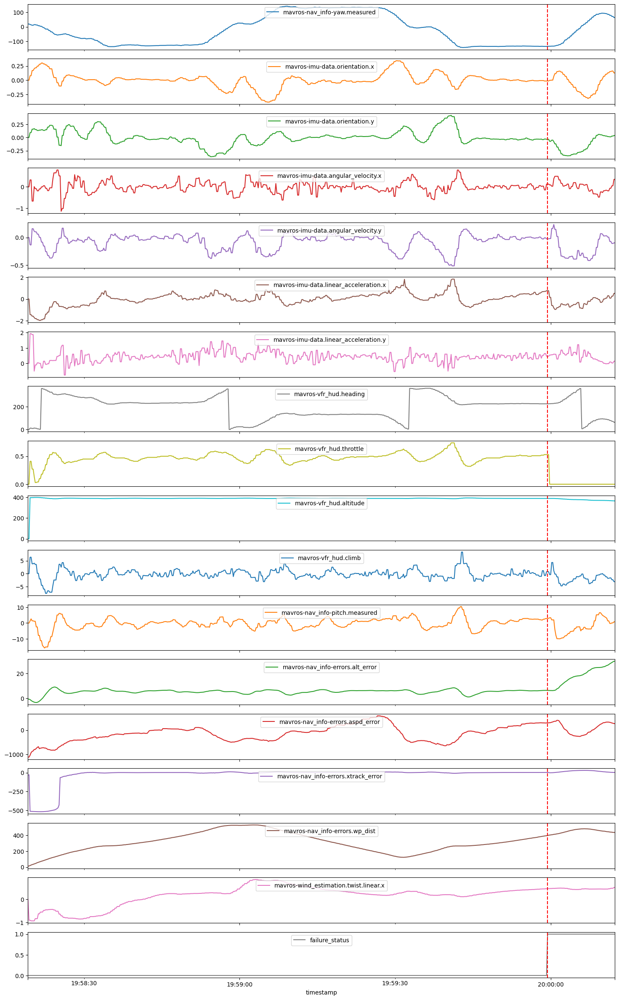

In [6]:
for flight_name in list(df_dict.keys())[:2]:
    
    # plots where engine failure happens
    if "engine_failure" not in flight_name:
        continue
    
    status_file = flight_name + "-failure_status-engines.csv"
    
    print(flight_name)

    failure_status = read_data(os.path.join(data_path, flight_name, status_file))
    failure_status = failure_status.resample("200ms").last()
    failure_status = failure_status.rename(columns={"field.data": "failure_status"})
    
    df_1 = df_dict[flight_name]
    df_1 = df_1.merge(failure_status, left_index=True, right_index=True, how="outer")
    df_1.iloc[0] = df_1.iloc[0].fillna(0)
    df_1 = df_1.pad()
    df_1["failure_status"] = df_1["failure_status"].astype(int)

    axes = df_1.plot(subplots=True, figsize=(18, 30), );
    
    # obtain the index or timestamp where failure status = 1
    idx = df_1["failure_status"].ne(0).idxmax()

    #Loop over all axis objects and create a vertical line in each of them and set legend location
    for ax in axes:
        ax.axvline(idx, color="red", linestyle="--")
        ax.legend(loc='upper center')

    
    #plt.savefig(f"Plots/{flight_name}.jpg")
    plt.show()
    

**Having dfs for all 69 features**

carbonZ_2018-10-05-15-55-10_engine_failure_with_emr_traj


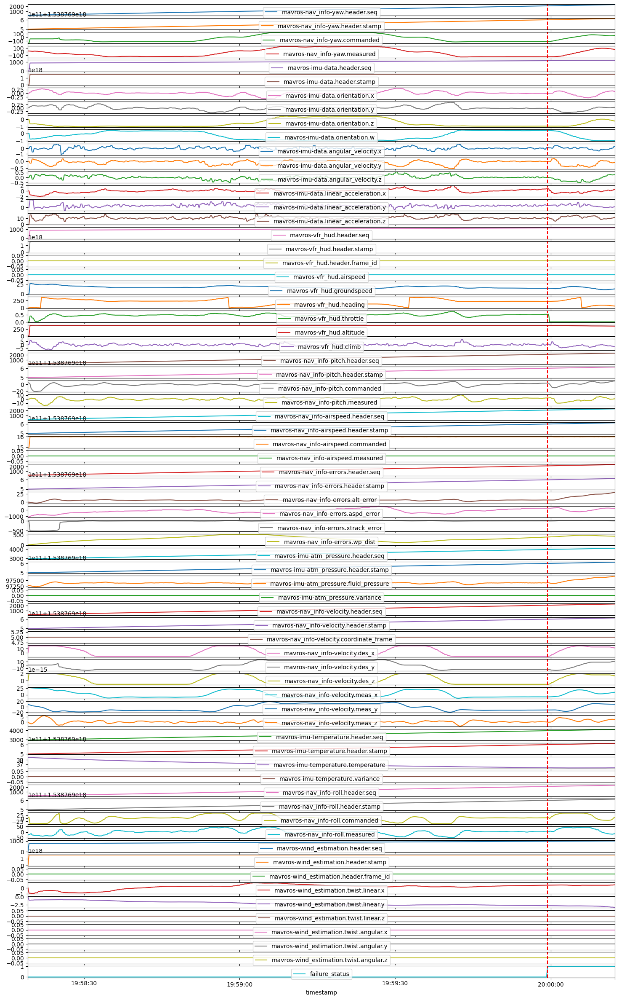

carbonZ_2018-10-18-11-06-06_engine_failure_with_emr_traj


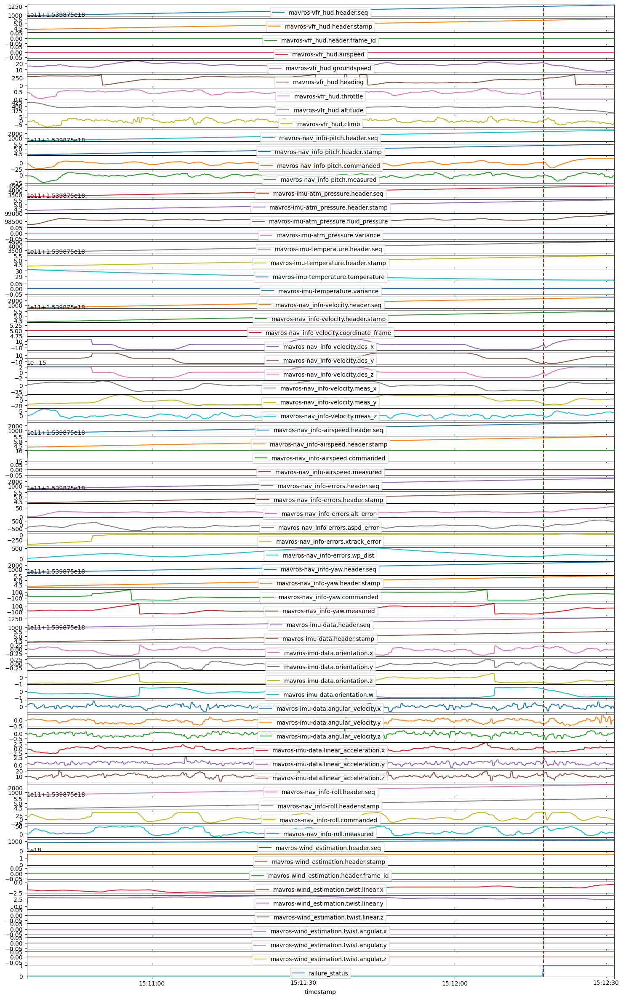

In [103]:
for flight_name in list(df_dict.keys())[:3]:
    
    # plots where engine failure happens
    if "engine_failure" not in flight_name:
        continue
    
    status_file = flight_name + "-failure_status-engines.csv"
    
    print(flight_name)

    failure_status = read_data(os.path.join(data_path, flight_name, status_file))
    failure_status = failure_status.resample("200ms").last()
    failure_status = failure_status.rename(columns={"field.data": "failure_status"})
    
    df_1 = df_dict[flight_name]
    df_1 = df_1.merge(failure_status, left_index=True, right_index=True, how="outer")
    df_1.iloc[0] = df_1.iloc[0].fillna(0)
    df_1 = df_1.pad()
    df_1["failure_status"] = df_1["failure_status"].astype(int)

    axes = df_1.plot(subplots=True, figsize=(18, 30), );
    
    # obtain the index or timestamp where failure status = 1
    idx = df_1["failure_status"].ne(0).idxmax()

    #Loop over all axis objects and create a vertical line in each of them and set legend location
    for ax in axes:
        ax.axvline(idx, color="red", linestyle="--")
        ax.legend(loc='upper center')

    
    #plt.savefig(f"Plots/{flight_name}.jpg")
    plt.show()
    

**17 features correlation**

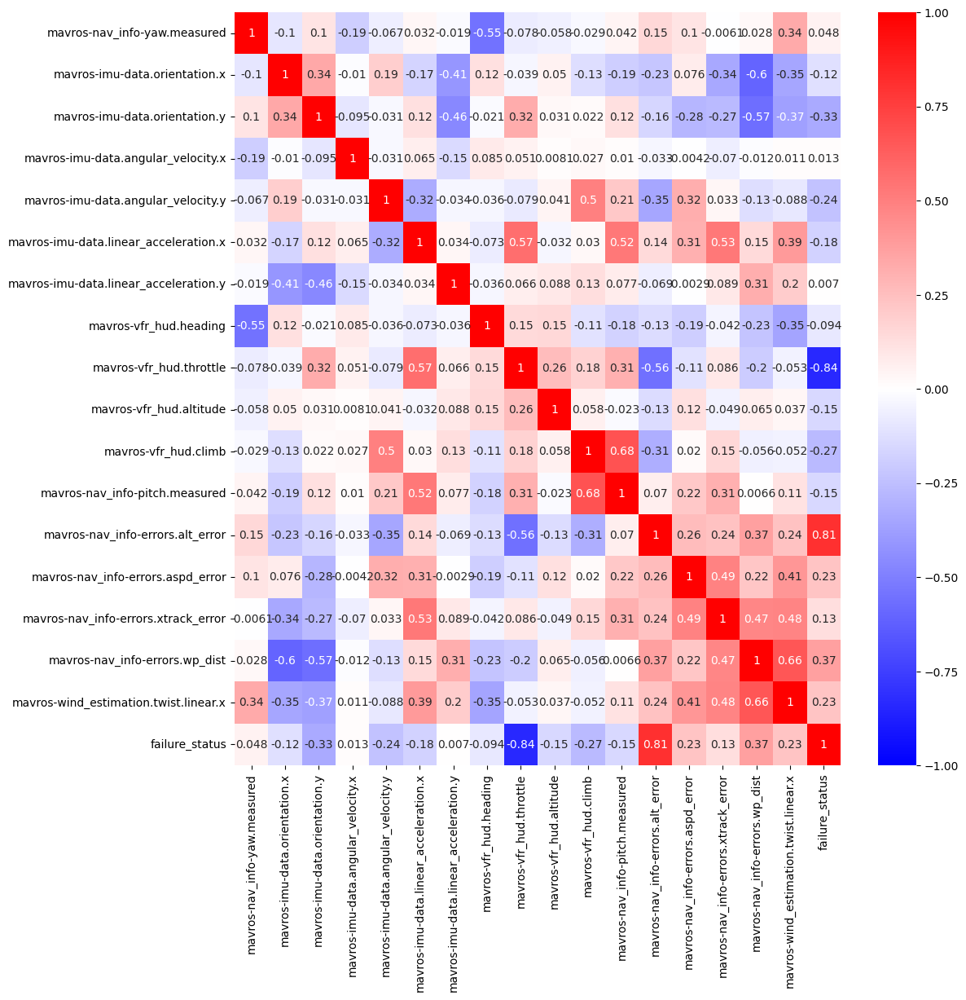

In [14]:
fig1 = plt.figure(figsize=(12, 12))
corr = df_1.corr(method="pearson")
sns.heatmap(corr, vmin=-1.0, vmax=1.0, cmap="bwr", annot=True)
plt.savefig("correlation_plot_17_features.jpg")
plt.show()

### **Correlation for All 69 the Features**

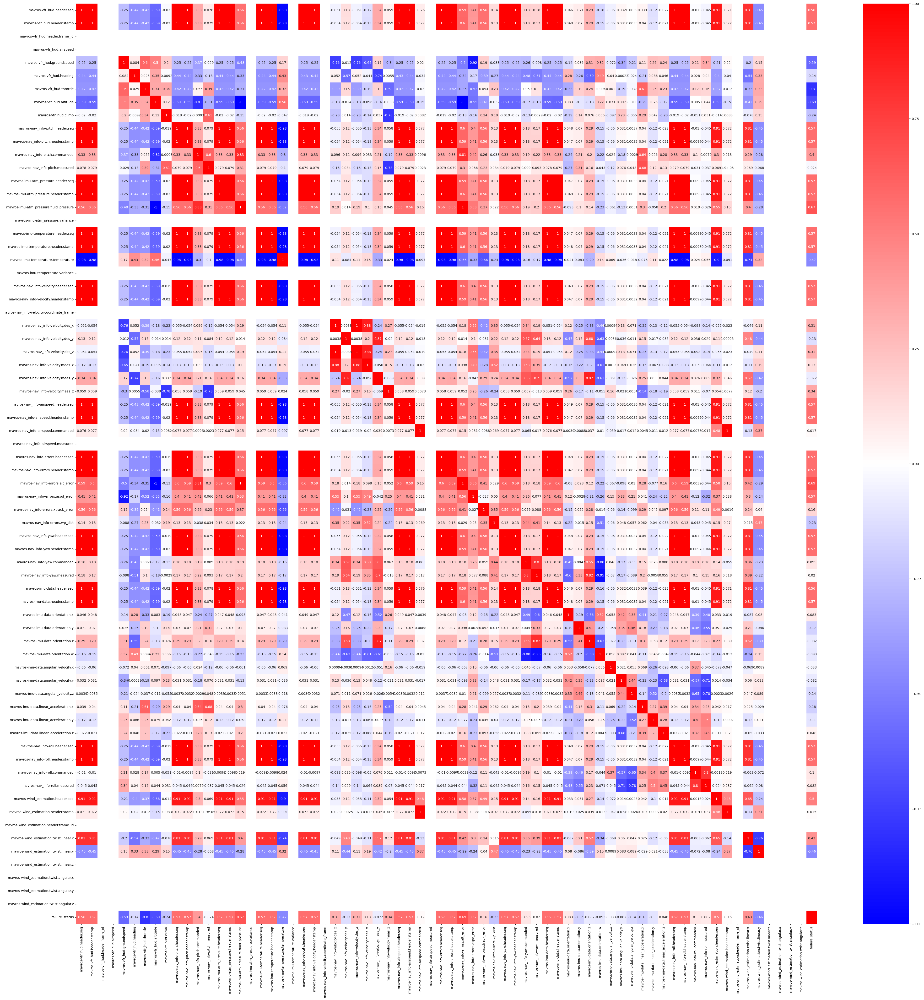

In [105]:
fig1 = plt.figure(figsize=(50, 50))
corr = df_1.corr(method="pearson")
sns.heatmap(corr, vmin=-1.0, vmax=1.0, cmap="bwr", annot=True)
plt.savefig("correlation_plot_all_featrures.jpg")
plt.show()

#### **Mutual info with Failure Status Y**

In [53]:
from sklearn.feature_selection import mutual_info_classif

X = df_1.drop(["failure_status"], axis=1)
y = df_1["failure_status"].copy()
y = y.values

y[y>0] = 1
y[y<0] = 0

mi = mutual_info_classif(
    X=X,
    y=y,
    random_state=42
)

print("Estimated mutual information for each feature:")

display(mi)

Estimated mutual information for each feature:


array([0.09979716, 0.14233462, 0.15034269, 0.08173838, 0.11708886,
       0.12873914, 0.08358978, 0.07928395, 0.32182771, 0.25643556,
       0.13531852, 0.11133976, 0.2769317 , 0.10100521, 0.1984555 ,
       0.19118013, 0.28718354])

**Plot**

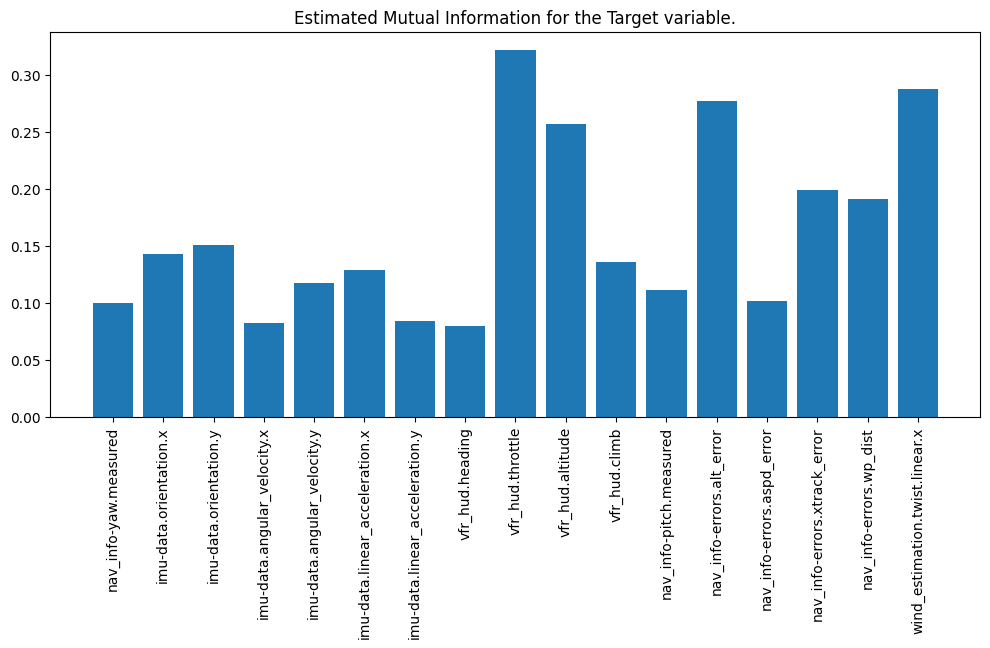

In [54]:
x_labels = list(map(lambda x: x[7:], X.columns))

fig1 = plt.figure(figsize=(12, 5))
plt.bar(x_labels, height=mi)

# it shows mutual information of individual topic features/parameters with the target variable
plt.title("Estimated Mutual Information for the Target variable.")
plt.xticks(rotation = 90)
plt.show()

## **Data Pre-Processing SLiding WIndows using Rolling Time Series Tsfresh Module**

In [7]:
### Calculate failure durations
def read_data(full_path):
    timestamp_column = "timestamp"
    df_tmp = pd.read_csv(full_path)
    df_tmp = df_tmp.rename(columns={"%time": timestamp_column})

    # actual data recorded in ns/nanosecond
    df_tmp[timestamp_column] = pd.to_datetime(df_tmp[timestamp_column], unit="ns")
    df_tmp.set_index(timestamp_column, inplace=True)
    return df_tmp


def extract_topic_name(flight_name, file_name):
    topic_name = file_name.split(flight_name)
    topic_name = topic_name[1]
    topic_name = topic_name[1:]
    topic_name = topic_name.split(".csv")
    topic_name = topic_name[0] 
    return topic_name

**Adding failure status column with the dataframe**

In [8]:
%%time

data_path = "ALFA Dataset/processed/"
time_column = "%time"
timestamp_column = "timestamp"
failure_column = "failure_status"

df_dict_with_failure = {}
failure_duration = []

for flight_name in list(df_dict.keys()):
    dfx = df_dict[flight_name]
    
    # if for the flight no failure happens, then the 'failure status' columns is replaced with dummy zero
    if "engine_failure" not in flight_name:
        failure_status = pd.DataFrame(data=[0] * len(dfx), 
                                      index=dfx.index, 
                                      columns=[failure_column]).head()
    
    # the sequence where failure occurs, add the failure column with proper failure info provied in the csv
    else:
        status_file = flight_name + "-failure_status-engines.csv"
        # read the csv of failure_status-emgines where engine failure is written, failure status topic csv was not taken previously
        # while forming x which is df_dict
        failure_status = read_data(os.path.join(data_path, flight_name, status_file))
        # resample the data to 5hz
        # last is the fn for resampling, computes the last entry of each group for a column, so for each 200ms interval it computes the last entry
        # bcz after failure it will not repair, so last entry will be the updated one
        failure_status = failure_status.resample("200ms").last()
        
        # rename the field data
        failure_status = failure_status.rename(columns={"field.data": failure_column})
    
    dfx = dfx.merge(failure_status, left_index=True, right_index=True, how="outer")
    dfx.iloc[0] = dfx.iloc[0].fillna(0)
    dfx = dfx.pad()
    dfx[failure_column] = dfx[failure_column].astype(int)
    
    if "engine_failure" in flight_name:
        idx = dfx[failure_column].ne(0).idxmax()
        failure_duration.append(len(dfx[dfx.index >= idx]))
    
    df_dict_with_failure[flight_name] = dfx
    
failure_duration = np.array(failure_duration)

CPU times: user 138 ms, sys: 4.87 ms, total: 143 ms
Wall time: 145 ms


**df_dict_with_failure contains flight data with failure_status column**

In [9]:
# is a dict that contains flight dataframes having the failure info attached to it
df_dict_with_failure[list(df_dict_with_failure.keys())[0]]

,mavros-nav_info-errors.alt_error,mavros-nav_info-errors.aspd_error,mavros-nav_info-errors.xtrack_error,mavros-nav_info-errors.wp_dist,mavros-vfr_hud.heading,mavros-vfr_hud.throttle,mavros-vfr_hud.altitude,mavros-vfr_hud.climb,mavros-nav_info-pitch.measured,mavros-wind_estimation.twist.linear.x,mavros-imu-data.orientation.x,mavros-imu-data.orientation.y,mavros-imu-data.angular_velocity.x,mavros-imu-data.angular_velocity.y,mavros-imu-data.linear_acceleration.x,mavros-imu-data.linear_acceleration.y,mavros-nav_info-yaw.measured,failure_status
timestamp,,,,,,,,,,,,,,,,,,
2018-07-18 20:40:12.600,-0.30,-502.687256,-38.140568,6.0,0.0,0.00,0.000000,0.000000,3.062958,-1.218821,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-141.265686,0
2018-07-18 20:40:12.800,-0.50,-464.151947,-33.904339,10.0,226.0,0.21,395.319977,2.441045,3.055814,-1.218193,0.122320,-0.381881,0.167355,-0.360088,-0.402073,0.274586,-132.508072,0
2018-07-18 20:40:13.000,-0.66,-455.761536,-29.814545,14.0,237.0,0.18,395.589996,3.015022,3.055814,-1.218193,0.087681,-0.385917,-0.084994,-0.308205,-0.735499,0.529559,-132.508072,0
2018-07-18 20:40:13.200,-0.80,-476.651764,-25.783993,18.0,237.0,0.18,395.589996,3.015022,2.909206,-1.218193,0.087681,-0.385917,-0.084994,-0.308205,-0.735499,0.529559,-122.356827,0
2018-07-18 20:40:13.400,-1.07,-456.884399,-20.003454,24.0,237.0,0.18,395.589996,3.015022,2.909206,-1.217648,0.087681,-0.385917,-0.084994,-0.308205,-0.735499,0.529559,-122.356827,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-07-18 20:40:42.000,-1.00,98.969177,-1.565937,43.0,36.0,0.34,395.750000,-2.138776,-0.378263,-1.134756,-0.143783,-0.075338,0.113523,-0.082823,0.921825,0.578592,36.993301,0
2018-07-18 20:40:42.200,-0.66,104.297066,-1.339478,43.0,36.0,0.34,395.750000,-2.138776,-0.378263,-1.114812,-0.143783,-0.075338,0.113523,-0.082823,0.921825,0.578592,36.993301,0
2018-07-18 20:40:42.400,-0.33,83.668900,-1.080170,43.0,42.0,0.36,395.149994,-1.963881,0.129150,-1.114812,-0.153044,-0.066362,-0.075179,-0.099307,1.363124,0.912018,42.352245,0


In [18]:
print(f"Min flight failure duration:\t {failure_duration.min()}") 
print(f"Mean flight failure duration:\t {round(failure_duration.mean(), 2)}") 
print(f"Max flight failure duration:\t {failure_duration.max()}") 
print(f"Failure durations - {np.sort(failure_duration)}")

Min flight failure duration:	 41
Mean flight failure duration:	 79.43
Max flight failure duration:	 118
Failure durations - [ 41  47  57  61  63  66  71  72  74  75  78  80  81  81  81  83  88  96
  97  99 105 113 118]


**Sliding window preprocess using rolling statistics**

![Screenshot from 2024-07-13 01-09-27.png](<attachment:Screenshot from 2024-07-13 01-09-27.png>)

Function:

* Identify Time Series: The function uses column_id to distinguish between different time series in the DataFrame.

* Rolling Window Application: It applies a rolling window to each time series according to the specified rolling_direction. rolling direction implies like the stride in time-series, how much stride it move towards rolling direction, while calculating the rlling stats, and place its window for evaluation

* Window Size: The window size is determined by max_timeshift and min_timeshift, which are both set to window_size-1, meaning each window will include window_size points.

* Parallel Processing: By setting n_jobs=4, the function will process the rolling windows in parallel using 4 CPU cores.\


**Note**:

* As window size is 40, so after rolling stats, the entire time series will be divided into sequences of 40
* EMWA will change the series into less absrupt one
* In case of flights where failure happened, it divides df into two parts, before failure label_0, after failure just triggered label_1
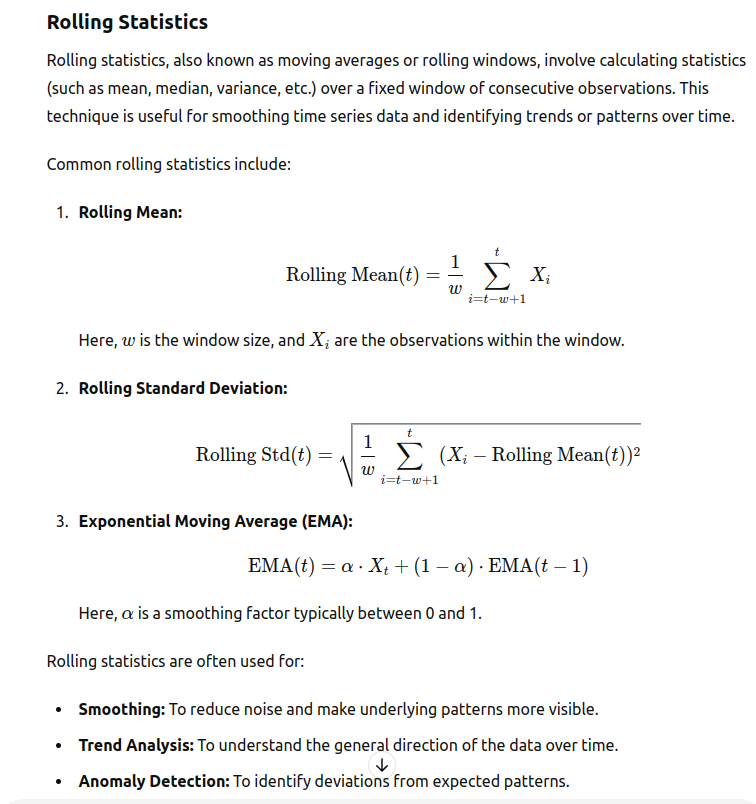

**1. Roll Time Series Over all the sequence**

In [50]:
%%time
import time

df_dict_rolled = {}
window_size = 40
steps = 5

# df_dict_with_Failure is a df dict that contains df having failures
for i, flight_name in enumerate(df_dict_with_failure.keys()):
    print("Flight:", flight_name)
    t = time.time()
    dfx = df_dict_with_failure[flight_name]
    
    if "no_failure" in flight_name:
        dfx_0 = dfx.copy()

        #print([i] * len(dfx_0))
        dfx_0["id"] = [i] * len(dfx_0)
        
        print(dfx_0["id"].shape)
        
        #print("dfx_0.columns:", dfx_0.columns)
        
        # rolling statistics for smoothening the timeseries data
        dfx_0_rolled = roll_time_series(
            df_or_dict=dfx_0,
            column_id="id",
            rolling_direction=steps,
            max_timeshift=(window_size-1),
            min_timeshift=(window_size-1),
            n_jobs=4
        )
        
        print(time.time() - t)
        
        df_dict_rolled[f"{flight_name}_label_0"] = dfx_0_rolled
        #print(dfx_0_rolled['id'])

    
    # for engine failure condition, it 
    elif "engine_failure" in flight_name:
        # gives the position of first max value in the column, i.e the time where the failure happens
        idx = dfx[failure_column].ne(0).idxmax()
        # creates a df having timestamps till the failure happens
        
        dfx_0 = dfx[dfx.index < idx]
        dfx_0["id"] = [i] * len(dfx_0)


        if len(dfx_0) > 0:
            dfx_0_rolled = roll_time_series(
                df_or_dict=dfx_0,
                column_id="id",
                rolling_direction=steps,
                max_timeshift=(window_size-1),
                min_timeshift=(window_size-1),
                n_jobs=4
            )
            # creates an instance till no failure occurs
            df_dict_rolled[f"{flight_name}_label_0"] = dfx_0_rolled

        # where the failure occurs
        dfx_1 = dfx[dfx.index >= idx]
        dfx_1["id"] = [i] * len(dfx_1)

        if len(dfx_1) > 0:
            dfx_1_rolled = roll_time_series(
                df_or_dict=dfx_1,
                column_id="id",
                rolling_direction=steps,
                max_timeshift=(window_size-1), # window size to be evaluated
                min_timeshift=(window_size-1), # window size to be evaluated
                n_jobs=4 # number of paralle process or CPU cores to be used
            )
            df_dict_rolled[f"{flight_name}_label_1"] = dfx_1_rolled

    

Flight: carbonZ_2018-07-18-16-37-39_1_no_failure
(152,)


Rolling: 100%|██████████| 16/16 [00:00<00:00, 824.87it/s]

0.2977170944213867
Flight: carbonZ_2018-10-05-15-55-10_engine_failure_with_emr_traj



<timed exec>:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/miko/anaconda3/envs/myenv/lib/python3.8/site-packages/tsfresh/utilities/dataframe_functions.py:536: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["sort"] = range(df.shape[0])
Rolling: 100%|██████████| 17/17 [00:00<00:00, 339.97it/s]
<timed exec>:63: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http

Flight: carbonZ_2018-10-18-11-06-06_engine_failure_with_emr_traj



<timed exec>:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/miko/anaconda3/envs/myenv/lib/python3.8/site-packages/tsfresh/utilities/dataframe_functions.py:536: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["sort"] = range(df.shape[0])
Rolling: 100%|██████████| 18/18 [00:00<00:00, 338.84it/s]
<timed exec>:63: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http

Flight: carbonZ_2018-10-05-14-37-22_1_no_failure
(364,)



Rolling: 100%|██████████| 19/19 [00:00<00:00, 504.09it/s]


0.11250519752502441
Flight: carbonZ_2018-10-18-11-04-08_1_engine_failure_with_emr_traj


<timed exec>:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/miko/anaconda3/envs/myenv/lib/python3.8/site-packages/tsfresh/utilities/dataframe_functions.py:536: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["sort"] = range(df.shape[0])
Rolling: 100%|██████████| 17/17 [00:00<00:00, 352.55it/s]
<timed exec>:63: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https

Flight: carbonZ_2018-07-30-16-39-00_1_engine_failure


<timed exec>:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/miko/anaconda3/envs/myenv/lib/python3.8/site-packages/tsfresh/utilities/dataframe_functions.py:536: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["sort"] = range(df.shape[0])
Rolling: 100%|██████████| 20/20 [00:00<00:00, 270.22it/s]
<timed exec>:63: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https

Flight: carbonZ_2018-09-11-14-22-07_1_engine_failure


<timed exec>:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/miko/anaconda3/envs/myenv/lib/python3.8/site-packages/tsfresh/utilities/dataframe_functions.py:536: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["sort"] = range(df.shape[0])
Rolling: 100%|██████████| 18/18 [00:00<00:00, 357.31it/s]
<timed exec>:63: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https

Flight: carbonZ_2018-07-30-17-10-45_engine_failure_with_emr_traj


<timed exec>:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/miko/anaconda3/envs/myenv/lib/python3.8/site-packages/tsfresh/utilities/dataframe_functions.py:536: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["sort"] = range(df.shape[0])
Rolling: 100%|██████████| 20/20 [00:00<00:00, 383.72it/s]
<timed exec>:63: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https

Flight: carbonZ_2018-09-11-15-05-11_2_no_failure
(338,)


Rolling: 100%|██████████| 17/17 [00:00<00:00, 444.14it/s]


0.1128995418548584
Flight: carbonZ_2018-07-30-17-46-31_engine_failure_with_emr_traj


<timed exec>:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/miko/anaconda3/envs/myenv/lib/python3.8/site-packages/tsfresh/utilities/dataframe_functions.py:536: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["sort"] = range(df.shape[0])
Rolling: 100%|██████████| 19/19 [00:00<00:00, 387.93it/s]
<timed exec>:63: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https

Flight: carbonZ_2018-07-30-16-39-00_3_no_failure
(396,)


Rolling: 100%|██████████| 20/20 [00:00<00:00, 415.66it/s]

0.12344646453857422
Flight: carbonZ_2018-07-18-16-37-39_2_engine_failure_with_emr_traj



<timed exec>:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/miko/anaconda3/envs/myenv/lib/python3.8/site-packages/tsfresh/utilities/dataframe_functions.py:536: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["sort"] = range(df.shape[0])
Rolling: 100%|██████████| 19/19 [00:00<00:00, 334.05it/s]
<timed exec>:63: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http

Flight: carbonZ_2018-07-18-15-53-31_1_engine_failure



<timed exec>:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/miko/anaconda3/envs/myenv/lib/python3.8/site-packages/tsfresh/utilities/dataframe_functions.py:536: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["sort"] = range(df.shape[0])
Rolling: 100%|██████████| 20/20 [00:00<00:00, 333.33it/s]
<timed exec>:63: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http

Flight: carbonZ_2018-10-18-11-04-08_2_engine_failure_with_emr_traj



<timed exec>:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/miko/anaconda3/envs/myenv/lib/python3.8/site-packages/tsfresh/utilities/dataframe_functions.py:536: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["sort"] = range(df.shape[0])
Rolling: 100%|██████████| 20/20 [00:00<00:00, 379.53it/s]
<timed exec>:63: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http

Flight: carbonZ_2018-09-11-14-41-38_no_failure
(217,)



Rolling: 100%|██████████| 15/15 [00:00<00:00, 549.36it/s]


0.10483407974243164
Flight: carbonZ_2018-10-18-11-08-24_no_failure
(132,)


Rolling: 100%|██████████| 14/14 [00:00<00:00, 742.54it/s]


0.0898900032043457
Flight: carbonZ_2018-09-11-14-16-55_no_failure
(169,)


Rolling: 100%|██████████| 17/17 [00:00<00:00, 658.22it/s]

0.1300678253173828
Flight: carbonZ_2018-07-30-16-29-45_engine_failure_with_emr_traj



<timed exec>:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/miko/anaconda3/envs/myenv/lib/python3.8/site-packages/tsfresh/utilities/dataframe_functions.py:536: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["sort"] = range(df.shape[0])
Rolling: 100%|██████████| 18/18 [00:00<00:00, 320.42it/s]
<timed exec>:63: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http

Flight: carbonZ_2018-09-11-14-22-07_2_engine_failure



<timed exec>:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/miko/anaconda3/envs/myenv/lib/python3.8/site-packages/tsfresh/utilities/dataframe_functions.py:536: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["sort"] = range(df.shape[0])
Rolling: 100%|██████████| 17/17 [00:00<00:00, 505.57it/s]
<timed exec>:63: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http

Flight: carbonZ_2018-10-05-16-04-46_engine_failure_with_emr_traj



<timed exec>:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/miko/anaconda3/envs/myenv/lib/python3.8/site-packages/tsfresh/utilities/dataframe_functions.py:536: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["sort"] = range(df.shape[0])
Rolling: 100%|██████████| 20/20 [00:00<00:00, 387.33it/s]
<timed exec>:63: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http

Flight: carbonZ_2018-09-11-11-56-30_engine_failure


/home/miko/anaconda3/envs/myenv/lib/python3.8/site-packages/tsfresh/utilities/dataframe_functions.py:536: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["sort"] = range(df.shape[0])
Rolling: 100%|██████████| 18/18 [00:00<00:00, 334.63it/s]
<timed exec>:63: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/miko/anaconda3/envs/myenv/lib/python3.8/site-packages/tsfresh/utilities/dataframe_functions.py:536: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .

Flight: carbonZ_2018-10-05-15-52-12_3_engine_failure_with_emr_traj



<timed exec>:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/miko/anaconda3/envs/myenv/lib/python3.8/site-packages/tsfresh/utilities/dataframe_functions.py:536: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["sort"] = range(df.shape[0])
Rolling: 100%|██████████| 17/17 [00:00<00:00, 614.28it/s]
<timed exec>:63: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http

Flight: carbonZ_2018-07-30-17-36-35_engine_failure_with_emr_traj


<timed exec>:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/miko/anaconda3/envs/myenv/lib/python3.8/site-packages/tsfresh/utilities/dataframe_functions.py:536: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["sort"] = range(df.shape[0])
Rolling: 100%|██████████| 20/20 [00:00<00:00, 87.62it/s]
<timed exec>:63: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https:

Flight: carbonZ_2018-10-18-11-03-57_engine_failure_with_emr_traj



<timed exec>:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/miko/anaconda3/envs/myenv/lib/python3.8/site-packages/tsfresh/utilities/dataframe_functions.py:536: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["sort"] = range(df.shape[0])
Rolling: 100%|██████████| 18/18 [00:00<00:00, 397.44it/s]
<timed exec>:63: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http

Flight: carbonZ_2018-07-30-17-20-01_engine_failure_with_emr_traj



<timed exec>:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/miko/anaconda3/envs/myenv/lib/python3.8/site-packages/tsfresh/utilities/dataframe_functions.py:536: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["sort"] = range(df.shape[0])
Rolling: 100%|██████████| 18/18 [00:00<00:00, 362.05it/s]
<timed exec>:63: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http

Flight: carbonZ_2018-07-18-15-53-31_2_engine_failure



<timed exec>:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/miko/anaconda3/envs/myenv/lib/python3.8/site-packages/tsfresh/utilities/dataframe_functions.py:536: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["sort"] = range(df.shape[0])
Rolling: 100%|██████████| 19/19 [00:00<00:00, 476.94it/s]
<timed exec>:63: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http

Flight: carbonZ_2018-10-18-11-04-00_engine_failure_with_emr_traj



<timed exec>:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/miko/anaconda3/envs/myenv/lib/python3.8/site-packages/tsfresh/utilities/dataframe_functions.py:536: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["sort"] = range(df.shape[0])
Rolling: 100%|██████████| 19/19 [00:00<00:00, 316.63it/s]
<timed exec>:63: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http

Flight: carbonZ_2018-07-18-16-22-01_engine_failure_with_emr_traj


<timed exec>:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/miko/anaconda3/envs/myenv/lib/python3.8/site-packages/tsfresh/utilities/dataframe_functions.py:536: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["sort"] = range(df.shape[0])
Rolling: 100%|██████████| 20/20 [00:00<00:00, 340.09it/s]
<timed exec>:63: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https

Flight: carbonZ_2018-10-05-15-52-12_1_no_failure
(448,)



Rolling: 100%|██████████| 18/18 [00:00<00:00, 437.53it/s]


0.11741495132446289
Flight: carbonZ_2018-07-30-16-39-00_2_engine_failure


<timed exec>:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/miko/anaconda3/envs/myenv/lib/python3.8/site-packages/tsfresh/utilities/dataframe_functions.py:536: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["sort"] = range(df.shape[0])
Rolling: 100%|██████████| 19/19 [00:00<00:00, 433.55it/s]
<timed exec>:63: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https

Flight: carbonZ_2018-10-05-15-52-12_2_no_failure
(243,)


Rolling: 100%|██████████| 17/17 [00:00<00:00, 597.40it/s]


0.09974193572998047
Flight: carbonZ_2018-10-18-11-04-35_engine_failure_with_emr_traj


<timed exec>:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/miko/anaconda3/envs/myenv/lib/python3.8/site-packages/tsfresh/utilities/dataframe_functions.py:536: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["sort"] = range(df.shape[0])
Rolling: 100%|██████████| 17/17 [00:00<00:00, 358.50it/s]
<timed exec>:63: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https

Flight: carbonZ_2018-10-05-14-34-20_1_no_failure
(335,)


Rolling: 100%|██████████| 17/17 [00:00<00:00, 506.28it/s]


0.10974717140197754
CPU times: user 2.12 s, sys: 2.87 s, total: 4.99 s
Wall time: 6.56 s


In [117]:
print(list(df_dict_rolled.keys()))
print(len(list(df_dict_rolled.keys())))

['carbonZ_2018-07-18-16-37-39_1_no_failure_label_0', 'carbonZ_2018-10-05-15-55-10_engine_failure_with_emr_traj_label_0', 'carbonZ_2018-10-05-15-55-10_engine_failure_with_emr_traj_label_1', 'carbonZ_2018-10-18-11-06-06_engine_failure_with_emr_traj_label_0', 'carbonZ_2018-10-18-11-06-06_engine_failure_with_emr_traj_label_1', 'carbonZ_2018-10-05-14-37-22_1_no_failure_label_0', 'carbonZ_2018-10-18-11-04-08_1_engine_failure_with_emr_traj_label_0', 'carbonZ_2018-10-18-11-04-08_1_engine_failure_with_emr_traj_label_1', 'carbonZ_2018-07-30-16-39-00_1_engine_failure_label_0', 'carbonZ_2018-07-30-16-39-00_1_engine_failure_label_1', 'carbonZ_2018-09-11-14-22-07_1_engine_failure_label_0', 'carbonZ_2018-09-11-14-22-07_1_engine_failure_label_1', 'carbonZ_2018-07-30-17-10-45_engine_failure_with_emr_traj_label_0', 'carbonZ_2018-07-30-17-10-45_engine_failure_with_emr_traj_label_1', 'carbonZ_2018-09-11-15-05-11_2_no_failure_label_0', 'carbonZ_2018-07-30-17-46-31_engine_failure_with_emr_traj_label_0', 'ca

**2. Roll Time Series Over flight sequence where no failure occured**

In [116]:
%%time
import time

df_dict_rolled_no_failure = {}
window_size = 40
steps = 5

# df_dict_with_Failure is a df dict that contains df having failures
for i, flight_name in enumerate(df_dict_with_failure.keys()):
    print("Flight:", flight_name)
    t = time.time()
    dfx = df_dict_with_failure[flight_name]
    
    if "no_failure" in flight_name:
        dfx_0 = dfx.copy()

        #print([i] * len(dfx_0))
        dfx_0["id"] = [i] * len(dfx_0)
        
        print(dfx_0["id"].shape)
        
        #print("dfx_0.columns:", dfx_0.columns)
        
        # rolling statistics for smoothening the timeseries data
        dfx_0_rolled = roll_time_series(
            df_or_dict=dfx_0,
            column_id="id",
            rolling_direction=steps,
            max_timeshift=(window_size-1),
            min_timeshift=(window_size-1),
            n_jobs=4
        )
        
        print(time.time() - t)
        
        df_dict_rolled_no_failure[f"{flight_name}_label_0"] = dfx_0_rolled
        #print(dfx_0_rolled['id'])

    
    # # for engine failure condition, it 
    # elif "engine_failure" in flight_name:
    #     # gives the position of first max value in the column, i.e the time where the failure happens
    #     idx = dfx[failure_column].ne(0).idxmax()
    #     # creates a df having timestamps till the failure happens
        
    #     dfx_0 = dfx[dfx.index < idx]
    #     dfx_0["id"] = [i] * len(dfx_0)


    #     if len(dfx_0) > 0:
    #         dfx_0_rolled = roll_time_series(
    #             df_or_dict=dfx_0,
    #             column_id="id",
    #             rolling_direction=steps,
    #             max_timeshift=(window_size-1),
    #             min_timeshift=(window_size-1),
    #             n_jobs=4
    #         )
    #         # creates an instance till no failure occurs
    #         df_dict_rolled[f"{flight_name}_label_0"] = dfx_0_rolled


    #     # where the failure occurs
    #     dfx_1 = dfx[dfx.index >= idx]
    #     dfx_1["id"] = [i] * len(dfx_1)

    #     if len(dfx_1) > 0:
    #         dfx_1_rolled = roll_time_series(
    #             df_or_dict=dfx_1,
    #             column_id="id",
    #             rolling_direction=steps,
    #             max_timeshift=(window_size-1), # window size to be evaluated
    #             min_timeshift=(window_size-1), # window size to be evaluated
    #             n_jobs=4 # number of paralle process or CPU cores to be used
    #         )
    #         df_dict_rolled[f"{flight_name}_label_1"] = dfx_1_rolled

    

Flight: carbonZ_2018-07-18-16-37-39_1_no_failure
(152,)


Rolling: 100%|██████████| 16/16 [00:00<00:00, 604.69it/s]


0.1629476547241211
Flight: carbonZ_2018-10-05-15-55-10_engine_failure_with_emr_traj
Flight: carbonZ_2018-10-18-11-06-06_engine_failure_with_emr_traj
Flight: carbonZ_2018-10-05-14-37-22_1_no_failure
(364,)


Rolling: 100%|██████████| 19/19 [00:00<00:00, 406.07it/s]


0.18849444389343262
Flight: carbonZ_2018-10-18-11-04-08_1_engine_failure_with_emr_traj
Flight: carbonZ_2018-07-30-16-39-00_1_engine_failure
Flight: carbonZ_2018-09-11-14-22-07_1_engine_failure
Flight: carbonZ_2018-07-30-17-10-45_engine_failure_with_emr_traj
Flight: carbonZ_2018-09-11-15-05-11_2_no_failure
(338,)


Rolling: 100%|██████████| 17/17 [00:00<00:00, 397.21it/s]


0.1867053508758545
Flight: carbonZ_2018-07-30-17-46-31_engine_failure_with_emr_traj
Flight: carbonZ_2018-07-30-16-39-00_3_no_failure
(396,)


Rolling: 100%|██████████| 20/20 [00:00<00:00, 374.61it/s]

0.20034217834472656
Flight: carbonZ_2018-07-18-16-37-39_2_engine_failure_with_emr_traj
Flight: carbonZ_2018-07-18-15-53-31_1_engine_failure
Flight: carbonZ_2018-10-18-11-04-08_2_engine_failure_with_emr_traj
Flight: carbonZ_2018-09-11-14-41-38_no_failure
(217,)



Rolling: 100%|██████████| 15/15 [00:00<00:00, 510.87it/s]

0.2556746006011963
Flight: carbonZ_2018-10-18-11-08-24_no_failure
(132,)



Rolling: 100%|██████████| 14/14 [00:00<00:00, 654.15it/s]


0.16667580604553223
Flight: carbonZ_2018-09-11-14-16-55_no_failure
(169,)


Rolling: 100%|██████████| 17/17 [00:00<00:00, 644.45it/s]


0.16724586486816406
Flight: carbonZ_2018-07-30-16-29-45_engine_failure_with_emr_traj
Flight: carbonZ_2018-09-11-14-22-07_2_engine_failure
Flight: carbonZ_2018-10-05-16-04-46_engine_failure_with_emr_traj
Flight: carbonZ_2018-09-11-11-56-30_engine_failure
Flight: carbonZ_2018-10-05-15-52-12_3_engine_failure_with_emr_traj
Flight: carbonZ_2018-07-30-17-36-35_engine_failure_with_emr_traj
Flight: carbonZ_2018-10-18-11-03-57_engine_failure_with_emr_traj
Flight: carbonZ_2018-07-30-17-20-01_engine_failure_with_emr_traj
Flight: carbonZ_2018-07-18-15-53-31_2_engine_failure
Flight: carbonZ_2018-10-18-11-04-00_engine_failure_with_emr_traj
Flight: carbonZ_2018-07-18-16-22-01_engine_failure_with_emr_traj
Flight: carbonZ_2018-10-05-15-52-12_1_no_failure
(448,)


Rolling: 100%|██████████| 18/18 [00:00<00:00, 322.68it/s]

0.20411348342895508
Flight: carbonZ_2018-07-30-16-39-00_2_engine_failure
Flight: carbonZ_2018-10-05-15-52-12_2_no_failure
(243,)



Rolling: 100%|██████████| 17/17 [00:00<00:00, 500.30it/s]


0.1682755947113037
Flight: carbonZ_2018-10-18-11-04-35_engine_failure_with_emr_traj
Flight: carbonZ_2018-10-05-14-34-20_1_no_failure
(335,)


Rolling: 100%|██████████| 17/17 [00:00<00:00, 389.49it/s]


0.19049549102783203
CPU times: user 368 ms, sys: 1 s, total: 1.37 s
Wall time: 1.89 s


In [60]:
print(list(df_dict_rolled_no_failure.keys()))
print(len(list(df_dict_rolled_no_failure.keys())))

['carbonZ_2018-07-18-16-37-39_1_no_failure_label_0', 'carbonZ_2018-10-05-14-37-22_1_no_failure_label_0', 'carbonZ_2018-09-11-15-05-11_2_no_failure_label_0', 'carbonZ_2018-07-30-16-39-00_3_no_failure_label_0', 'carbonZ_2018-09-11-14-41-38_no_failure_label_0', 'carbonZ_2018-10-18-11-08-24_no_failure_label_0', 'carbonZ_2018-09-11-14-16-55_no_failure_label_0', 'carbonZ_2018-10-05-15-52-12_1_no_failure_label_0', 'carbonZ_2018-10-05-15-52-12_2_no_failure_label_0', 'carbonZ_2018-10-05-14-34-20_1_no_failure_label_0']
10


**3. Roll Time Series Over flight sequence with failure event only**

In [118]:
%%time
import time

df_dict_rolled_failure_only = {}
window_size = 40
steps = 5

# df_dict_with_Failure is a df dict that contains df having failures
for i, flight_name in enumerate(df_dict_with_failure.keys()):
    print("Flight:", flight_name)
    t = time.time()
    dfx = df_dict_with_failure[flight_name]
    
    # if "no_failure" in flight_name:
    #     dfx_0 = dfx.copy()

    #     #print([i] * len(dfx_0))
    #     dfx_0["id"] = [i] * len(dfx_0)
        
    #     print(dfx_0["id"].shape)
        
    #     #print("dfx_0.columns:", dfx_0.columns)
        
    #     # rolling statistics for smoothening the timeseries data
    #     dfx_0_rolled = roll_time_series(
    #         df_or_dict=dfx_0,
    #         column_id="id",
    #         rolling_direction=steps,
    #         max_timeshift=(window_size-1),
    #         min_timeshift=(window_size-1),
    #         n_jobs=4
    #     )
        
    #     print(time.time() - t)
        
    #     df_dict_rolled[f"{flight_name}_label_0"] = dfx_0_rolled
    #     #print(dfx_0_rolled['id'])

    
    # for engine failure condition, it 
    if "engine_failure" in flight_name:
        # gives the position of first max value in the column, i.e the time where the failure happens
        idx = dfx[failure_column].ne(0).idxmax()
        # creates a df having timestamps till the failure happens
        
        dfx_0 = dfx[dfx.index < idx]
        dfx_0["id"] = [i] * len(dfx_0)


        if len(dfx_0) > 0:
            dfx_0_rolled = roll_time_series(
                df_or_dict=dfx_0,
                column_id="id",
                rolling_direction=steps,
                max_timeshift=(window_size-1),
                min_timeshift=(window_size-1),
                n_jobs=4
            )
            # creates an instance till no failure occurs
            df_dict_rolled_failure_only[f"{flight_name}_label_0"] = dfx_0_rolled


        # where the failure occurs
        dfx_1 = dfx[dfx.index >= idx]
        dfx_1["id"] = [i] * len(dfx_1)

        if len(dfx_1) > 0:
            dfx_1_rolled = roll_time_series(
                df_or_dict=dfx_1,
                column_id="id",
                rolling_direction=steps,
                max_timeshift=(window_size-1), # window size to be evaluated
                min_timeshift=(window_size-1), # window size to be evaluated
                n_jobs=4 # number of paralle process or CPU cores to be used
            )
            df_dict_rolled_failure_only[f"{flight_name}_label_1"] = dfx_1_rolled



Flight: carbonZ_2018-07-18-16-37-39_1_no_failure
Flight: carbonZ_2018-10-05-15-55-10_engine_failure_with_emr_traj


<timed exec>:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/miko/anaconda3/envs/myenv/lib/python3.8/site-packages/tsfresh/utilities/dataframe_functions.py:536: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["sort"] = range(df.shape[0])
Rolling: 100%|██████████| 17/17 [00:00<00:00, 283.67it/s]
<timed exec>:64: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https

Flight: carbonZ_2018-10-18-11-06-06_engine_failure_with_emr_traj


/home/miko/anaconda3/envs/myenv/lib/python3.8/site-packages/tsfresh/utilities/dataframe_functions.py:536: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["sort"] = range(df.shape[0])
Rolling: 100%|██████████| 18/18 [00:00<00:00, 313.67it/s]
<timed exec>:64: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/miko/anaconda3/envs/myenv/lib/python3.8/site-packages/tsfresh/utilities/dataframe_functions.py:536: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .

Flight: carbonZ_2018-10-05-14-37-22_1_no_failure
Flight: carbonZ_2018-10-18-11-04-08_1_engine_failure_with_emr_traj


<timed exec>:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/miko/anaconda3/envs/myenv/lib/python3.8/site-packages/tsfresh/utilities/dataframe_functions.py:536: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["sort"] = range(df.shape[0])
Rolling: 100%|██████████| 17/17 [00:00<00:00, 310.85it/s]
<timed exec>:64: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https

Flight: carbonZ_2018-07-30-16-39-00_1_engine_failure


<timed exec>:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/miko/anaconda3/envs/myenv/lib/python3.8/site-packages/tsfresh/utilities/dataframe_functions.py:536: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["sort"] = range(df.shape[0])
Rolling: 100%|██████████| 20/20 [00:00<00:00, 138.81it/s]
<timed exec>:64: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https

Flight: carbonZ_2018-09-11-14-22-07_1_engine_failure


<timed exec>:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/miko/anaconda3/envs/myenv/lib/python3.8/site-packages/tsfresh/utilities/dataframe_functions.py:536: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["sort"] = range(df.shape[0])
Rolling: 100%|██████████| 18/18 [00:00<00:00, 314.95it/s]
<timed exec>:64: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https

Flight: carbonZ_2018-07-30-17-10-45_engine_failure_with_emr_traj


Rolling: 100%|██████████| 20/20 [00:00<00:00, 312.13it/s]
<timed exec>:64: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/miko/anaconda3/envs/myenv/lib/python3.8/site-packages/tsfresh/utilities/dataframe_functions.py:536: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["sort"] = range(df.shape[0])
Rolling: 100%|██████████| 17/17 [00:00<00:00, 1029.81it/s]


Flight: carbonZ_2018-09-11-15-05-11_2_no_failure
Flight: carbonZ_2018-07-30-17-46-31_engine_failure_with_emr_traj


<timed exec>:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/miko/anaconda3/envs/myenv/lib/python3.8/site-packages/tsfresh/utilities/dataframe_functions.py:536: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["sort"] = range(df.shape[0])
Rolling: 100%|██████████| 19/19 [00:00<00:00, 374.85it/s]
<timed exec>:64: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https

Flight: carbonZ_2018-07-30-16-39-00_3_no_failure
Flight: carbonZ_2018-07-18-16-37-39_2_engine_failure_with_emr_traj


<timed exec>:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/miko/anaconda3/envs/myenv/lib/python3.8/site-packages/tsfresh/utilities/dataframe_functions.py:536: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["sort"] = range(df.shape[0])
Rolling: 100%|██████████| 19/19 [00:00<00:00, 299.20it/s]
<timed exec>:64: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https

Flight: carbonZ_2018-07-18-15-53-31_1_engine_failure


<timed exec>:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/miko/anaconda3/envs/myenv/lib/python3.8/site-packages/tsfresh/utilities/dataframe_functions.py:536: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["sort"] = range(df.shape[0])
Rolling: 100%|██████████| 20/20 [00:00<00:00, 335.42it/s]
<timed exec>:64: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https

Flight: carbonZ_2018-10-18-11-04-08_2_engine_failure_with_emr_traj


<timed exec>:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/miko/anaconda3/envs/myenv/lib/python3.8/site-packages/tsfresh/utilities/dataframe_functions.py:536: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["sort"] = range(df.shape[0])
Rolling: 100%|██████████| 20/20 [00:00<00:00, 400.12it/s]
<timed exec>:64: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https

Flight: carbonZ_2018-09-11-14-41-38_no_failure
Flight: carbonZ_2018-10-18-11-08-24_no_failure
Flight: carbonZ_2018-09-11-14-16-55_no_failure
Flight: carbonZ_2018-07-30-16-29-45_engine_failure_with_emr_traj


<timed exec>:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/miko/anaconda3/envs/myenv/lib/python3.8/site-packages/tsfresh/utilities/dataframe_functions.py:536: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["sort"] = range(df.shape[0])
Rolling: 100%|██████████| 18/18 [00:00<00:00, 286.96it/s]
<timed exec>:64: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https

Flight: carbonZ_2018-09-11-14-22-07_2_engine_failure


<timed exec>:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/miko/anaconda3/envs/myenv/lib/python3.8/site-packages/tsfresh/utilities/dataframe_functions.py:536: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["sort"] = range(df.shape[0])
Rolling: 100%|██████████| 17/17 [00:00<00:00, 615.53it/s]
<timed exec>:64: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https

Flight: carbonZ_2018-10-05-16-04-46_engine_failure_with_emr_traj


/home/miko/anaconda3/envs/myenv/lib/python3.8/site-packages/tsfresh/utilities/dataframe_functions.py:536: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["sort"] = range(df.shape[0])
Rolling: 100%|██████████| 20/20 [00:00<00:00, 364.15it/s]
<timed exec>:64: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/miko/anaconda3/envs/myenv/lib/python3.8/site-packages/tsfresh/utilities/dataframe_functions.py:536: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .

Flight: carbonZ_2018-09-11-11-56-30_engine_failure


<timed exec>:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/miko/anaconda3/envs/myenv/lib/python3.8/site-packages/tsfresh/utilities/dataframe_functions.py:536: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["sort"] = range(df.shape[0])
Rolling: 100%|██████████| 18/18 [00:00<00:00, 313.39it/s]
<timed exec>:64: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https

Flight: carbonZ_2018-10-05-15-52-12_3_engine_failure_with_emr_traj


<timed exec>:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/miko/anaconda3/envs/myenv/lib/python3.8/site-packages/tsfresh/utilities/dataframe_functions.py:536: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["sort"] = range(df.shape[0])
Rolling: 100%|██████████| 17/17 [00:00<00:00, 563.94it/s]
<timed exec>:64: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https

Flight: carbonZ_2018-07-30-17-36-35_engine_failure_with_emr_traj


<timed exec>:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/miko/anaconda3/envs/myenv/lib/python3.8/site-packages/tsfresh/utilities/dataframe_functions.py:536: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["sort"] = range(df.shape[0])
Rolling: 100%|██████████| 20/20 [00:00<00:00, 275.00it/s]
<timed exec>:64: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https

Flight: carbonZ_2018-10-18-11-03-57_engine_failure_with_emr_traj


<timed exec>:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/miko/anaconda3/envs/myenv/lib/python3.8/site-packages/tsfresh/utilities/dataframe_functions.py:536: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["sort"] = range(df.shape[0])
Rolling: 100%|██████████| 18/18 [00:00<00:00, 329.42it/s]
<timed exec>:64: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https

Flight: carbonZ_2018-07-30-17-20-01_engine_failure_with_emr_traj


<timed exec>:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/miko/anaconda3/envs/myenv/lib/python3.8/site-packages/tsfresh/utilities/dataframe_functions.py:536: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["sort"] = range(df.shape[0])
Rolling: 100%|██████████| 18/18 [00:00<00:00, 332.84it/s]
<timed exec>:64: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https

Flight: carbonZ_2018-07-18-15-53-31_2_engine_failure


<timed exec>:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/miko/anaconda3/envs/myenv/lib/python3.8/site-packages/tsfresh/utilities/dataframe_functions.py:536: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["sort"] = range(df.shape[0])
Rolling: 100%|██████████| 19/19 [00:00<00:00, 419.46it/s]
<timed exec>:64: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https

Flight: carbonZ_2018-10-18-11-04-00_engine_failure_with_emr_traj


/home/miko/anaconda3/envs/myenv/lib/python3.8/site-packages/tsfresh/utilities/dataframe_functions.py:536: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["sort"] = range(df.shape[0])
Rolling: 100%|██████████| 19/19 [00:00<00:00, 336.49it/s]
<timed exec>:64: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/miko/anaconda3/envs/myenv/lib/python3.8/site-packages/tsfresh/utilities/dataframe_functions.py:536: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .

Flight: carbonZ_2018-07-18-16-22-01_engine_failure_with_emr_traj


/home/miko/anaconda3/envs/myenv/lib/python3.8/site-packages/tsfresh/utilities/dataframe_functions.py:536: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["sort"] = range(df.shape[0])
Rolling: 100%|██████████| 20/20 [00:00<00:00, 140.84it/s]
<timed exec>:64: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/miko/anaconda3/envs/myenv/lib/python3.8/site-packages/tsfresh/utilities/dataframe_functions.py:536: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .

Flight: carbonZ_2018-10-05-15-52-12_1_no_failure
Flight: carbonZ_2018-07-30-16-39-00_2_engine_failure


<timed exec>:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/miko/anaconda3/envs/myenv/lib/python3.8/site-packages/tsfresh/utilities/dataframe_functions.py:536: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["sort"] = range(df.shape[0])
Rolling: 100%|██████████| 19/19 [00:00<00:00, 374.24it/s]
<timed exec>:64: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https

Flight: carbonZ_2018-10-05-15-52-12_2_no_failure
Flight: carbonZ_2018-10-18-11-04-35_engine_failure_with_emr_traj


<timed exec>:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/miko/anaconda3/envs/myenv/lib/python3.8/site-packages/tsfresh/utilities/dataframe_functions.py:536: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["sort"] = range(df.shape[0])
Rolling: 100%|██████████| 17/17 [00:00<00:00, 305.02it/s]
<timed exec>:64: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https

Flight: carbonZ_2018-10-05-14-34-20_1_no_failure
CPU times: user 1.89 s, sys: 4.21 s, total: 6.1 s
Wall time: 8.48 s


In [119]:
print(list(df_dict_rolled_failure_only.keys()))
print(len(list(df_dict_rolled_failure_only.keys())))

['carbonZ_2018-10-05-15-55-10_engine_failure_with_emr_traj_label_0', 'carbonZ_2018-10-05-15-55-10_engine_failure_with_emr_traj_label_1', 'carbonZ_2018-10-18-11-06-06_engine_failure_with_emr_traj_label_0', 'carbonZ_2018-10-18-11-06-06_engine_failure_with_emr_traj_label_1', 'carbonZ_2018-10-18-11-04-08_1_engine_failure_with_emr_traj_label_0', 'carbonZ_2018-10-18-11-04-08_1_engine_failure_with_emr_traj_label_1', 'carbonZ_2018-07-30-16-39-00_1_engine_failure_label_0', 'carbonZ_2018-07-30-16-39-00_1_engine_failure_label_1', 'carbonZ_2018-09-11-14-22-07_1_engine_failure_label_0', 'carbonZ_2018-09-11-14-22-07_1_engine_failure_label_1', 'carbonZ_2018-07-30-17-10-45_engine_failure_with_emr_traj_label_0', 'carbonZ_2018-07-30-17-10-45_engine_failure_with_emr_traj_label_1', 'carbonZ_2018-07-30-17-46-31_engine_failure_with_emr_traj_label_0', 'carbonZ_2018-07-30-17-46-31_engine_failure_with_emr_traj_label_1', 'carbonZ_2018-07-18-16-37-39_2_engine_failure_with_emr_traj_label_0', 'carbonZ_2018-07-18-1

In [135]:
print(list(df_dict.keys())[0])
print(f"Actual df:")
df_dict[list(df_dict.keys())[0]]

carbonZ_2018-07-18-16-37-39_1_no_failure
Actual df:


,mavros-nav_info-errors.alt_error,mavros-nav_info-errors.aspd_error,mavros-nav_info-errors.xtrack_error,mavros-nav_info-errors.wp_dist,mavros-vfr_hud.heading,mavros-vfr_hud.throttle,mavros-vfr_hud.altitude,mavros-vfr_hud.climb,mavros-nav_info-pitch.measured,mavros-wind_estimation.twist.linear.x,mavros-imu-data.orientation.x,mavros-imu-data.orientation.y,mavros-imu-data.angular_velocity.x,mavros-imu-data.angular_velocity.y,mavros-imu-data.linear_acceleration.x,mavros-imu-data.linear_acceleration.y,mavros-nav_info-yaw.measured
timestamp,,,,,,,,,,,,,,,,,
2018-07-18 20:40:12.600,-0.30,-502.687256,-38.140568,6.0,0.0,0.00,0.000000,0.000000,3.062958,-1.218821,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-141.265686
2018-07-18 20:40:12.800,-0.50,-464.151947,-33.904339,10.0,226.0,0.21,395.319977,2.441045,3.055814,-1.218193,0.122320,-0.381881,0.167355,-0.360088,-0.402073,0.274586,-132.508072
2018-07-18 20:40:13.000,-0.66,-455.761536,-29.814545,14.0,237.0,0.18,395.589996,3.015022,3.055814,-1.218193,0.087681,-0.385917,-0.084994,-0.308205,-0.735499,0.529559,-132.508072
2018-07-18 20:40:13.200,-0.80,-476.651764,-25.783993,18.0,237.0,0.18,395.589996,3.015022,2.909206,-1.218193,0.087681,-0.385917,-0.084994,-0.308205,-0.735499,0.529559,-122.356827
2018-07-18 20:40:13.400,-1.07,-456.884399,-20.003454,24.0,237.0,0.18,395.589996,3.015022,2.909206,-1.217648,0.087681,-0.385917,-0.084994,-0.308205,-0.735499,0.529559,-122.356827
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-07-18 20:40:42.000,-1.00,98.969177,-1.565937,43.0,36.0,0.34,395.750000,-2.138776,-0.378263,-1.134756,-0.143783,-0.075338,0.113523,-0.082823,0.921825,0.578592,36.993301
2018-07-18 20:40:42.200,-0.66,104.297066,-1.339478,43.0,36.0,0.34,395.750000,-2.138776,-0.378263,-1.114812,-0.143783,-0.075338,0.113523,-0.082823,0.921825,0.578592,36.993301
2018-07-18 20:40:42.400,-0.33,83.668900,-1.080170,43.0,42.0,0.36,395.149994,-1.963881,0.129150,-1.114812,-0.153044,-0.066362,-0.075179,-0.099307,1.363124,0.912018,42.352245


In [141]:
df_dict['carbonZ_2018-07-18-16-37-39_1_no_failure'].to_csv("carbonZ_2018-07-18-16-37-39_1_no_failure.csv")

In [138]:
print(f"Rolling df:")
df_dict_rolled['carbonZ_2018-07-18-16-37-39_1_no_failure'].to_csv("carbonZ_2018-07-18-16-37-39_1_no_failure.csv")

Rolling df:


,mavros-nav_info-errors.alt_error,mavros-nav_info-errors.aspd_error,mavros-nav_info-errors.xtrack_error,mavros-nav_info-errors.wp_dist,mavros-vfr_hud.heading,mavros-vfr_hud.throttle,mavros-vfr_hud.altitude,mavros-vfr_hud.climb,mavros-nav_info-pitch.measured,mavros-wind_estimation.twist.linear.x,mavros-imu-data.orientation.x,mavros-imu-data.orientation.y,mavros-imu-data.angular_velocity.x,mavros-imu-data.angular_velocity.y,mavros-imu-data.linear_acceleration.x,mavros-imu-data.linear_acceleration.y,mavros-nav_info-yaw.measured,failure_status,id,sort
0,-0.66,-455.761536,-29.814545,14.0,237.0,0.18,395.589996,3.015022,3.055814,-1.218193,0.087681,-0.385917,-0.084994,-0.308205,-0.735499,0.529559,-132.508072,0,"(0, 41)",2
1,-0.80,-476.651764,-25.783993,18.0,237.0,0.18,395.589996,3.015022,2.909206,-1.218193,0.087681,-0.385917,-0.084994,-0.308205,-0.735499,0.529559,-122.356827,0,"(0, 41)",3
2,-1.07,-456.884399,-20.003454,24.0,237.0,0.18,395.589996,3.015022,2.909206,-1.217648,0.087681,-0.385917,-0.084994,-0.308205,-0.735499,0.529559,-122.356827,0,"(0, 41)",4
3,-1.15,-422.000488,-18.156500,26.0,251.0,0.15,396.000000,1.774444,1.896270,-1.217648,0.044337,-0.369725,-0.071604,-0.349159,-0.872792,-0.304006,-108.404129,0,"(0, 41)",5
4,-1.33,-431.838043,-14.543348,30.0,260.0,0.14,396.309998,1.842530,1.896270,-1.227921,0.013611,-0.374386,0.049216,-0.333110,-0.539366,0.460913,-108.404129,0,"(0, 41)",6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
835,-1.00,98.969177,-1.565937,43.0,36.0,0.34,395.750000,-2.138776,-0.378263,-1.134756,-0.143783,-0.075338,0.113523,-0.082823,0.921825,0.578592,36.993301,0,"(0, 151)",147
836,-0.66,104.297066,-1.339478,43.0,36.0,0.34,395.750000,-2.138776,-0.378263,-1.114812,-0.143783,-0.075338,0.113523,-0.082823,0.921825,0.578592,36.993301,0,"(0, 151)",148
837,-0.33,83.668900,-1.080170,43.0,42.0,0.36,395.149994,-1.963881,0.129150,-1.114812,-0.153044,-0.066362,-0.075179,-0.099307,1.363124,0.912018,42.352245,0,"(0, 151)",149
838,0.02,36.839771,-0.728273,43.0,42.0,0.36,395.149994,-1.963881,0.129150,-1.087618,-0.153044,-0.066362,-0.075179,-0.099307,1.363124,0.912018,42.352245,0,"(0, 151)",150


In [139]:
df_dict_rolled['carbonZ_2018-07-18-16-37-39_1_no_failure_label_0'].to_csv('carbonZ_2018-07-18-16-37-39_1_no_failure_rolled.csv')

In [12]:
print(f"Total rolling dfs - {len(df_dict_rolled.keys())}")

Total rolling dfs - 56


**Note: For 23 flights 23 (label_0) + 23 (label_1) + 10 (label_0_no_fault) = 56**

#### **Save the sliding window pre-processed data**

**1. For all the flights**

In [120]:
df_file_name = "sliding_window-preprocessed_median-resampling_feature-selection_rolling_v2.pkl"

with open(df_file_name, "wb") as f:
    dill.dump(df_dict_rolled, f)

**2. For flights with no failure**

In [121]:
df_file_name = "sliding_window-preprocessed_median-resampling_feature-selection_rolling_no_failure_v2.pkl"

with open(df_file_name, "wb") as f:
    dill.dump(df_dict_rolled_no_failure, f)

**3. For flights with failure only flights**

In [122]:
df_file_name = "sliding_window-preprocessed_median-resampling_feature-selection_rolling_failure_only_v2.pkl"

with open(df_file_name, "wb") as f:
    dill.dump(df_dict_rolled_failure_only, f)

### **Plot the Sliding Window Resampling, after rolling stats**

#### **Split sliding windows into instances**

Split the series into instances of 40

In [14]:
flight_name = 'carbonZ_2018-07-18-15-53-31_1_engine_failure_label_0' 

# group by id
grouped = df_dict_rolled[flight_name].groupby('id')

# note here, each of the instance has length 40, but the difference between two is 5, which is rolling direction or step size here or stride

cnt = 1
#for name, group in grouped[0:1]:
for name, group in grouped:    
    print(f"{cnt}. {flight_name}_instance_{name[0]}_{name[1]}")
    cnt += 1

1. carbonZ_2018-07-18-15-53-31_1_engine_failure_label_0_instance_12_40
2. carbonZ_2018-07-18-15-53-31_1_engine_failure_label_0_instance_12_45
3. carbonZ_2018-07-18-15-53-31_1_engine_failure_label_0_instance_12_50
4. carbonZ_2018-07-18-15-53-31_1_engine_failure_label_0_instance_12_55
5. carbonZ_2018-07-18-15-53-31_1_engine_failure_label_0_instance_12_60
6. carbonZ_2018-07-18-15-53-31_1_engine_failure_label_0_instance_12_65
7. carbonZ_2018-07-18-15-53-31_1_engine_failure_label_0_instance_12_70
8. carbonZ_2018-07-18-15-53-31_1_engine_failure_label_0_instance_12_75
9. carbonZ_2018-07-18-15-53-31_1_engine_failure_label_0_instance_12_80
10. carbonZ_2018-07-18-15-53-31_1_engine_failure_label_0_instance_12_85
11. carbonZ_2018-07-18-15-53-31_1_engine_failure_label_0_instance_12_90
12. carbonZ_2018-07-18-15-53-31_1_engine_failure_label_0_instance_12_95
13. carbonZ_2018-07-18-15-53-31_1_engine_failure_label_0_instance_12_100
14. carbonZ_2018-07-18-15-53-31_1_engine_failure_label_0_instance_12_105

In [52]:
grouped.head()

,mavros-nav_info-velocity.meas_y,mavros-nav_info-yaw.measured,mavros-imu-data.orientation.x,mavros-imu-data.orientation.y,mavros-imu-data.angular_velocity.x,mavros-imu-data.angular_velocity.y,mavros-imu-data.linear_acceleration.x,mavros-imu-data.linear_acceleration.y,mavros-nav_info-errors.alt_error,mavros-nav_info-errors.aspd_error,mavros-nav_info-errors.xtrack_error,mavros-nav_info-errors.wp_dist,mavros-nav_info-pitch.measured,mavros-wind_estimation.twist.linear.x,mavros-vfr_hud.heading,mavros-vfr_hud.climb,mavros-nav_info-roll.measured,failure_status,id,sort
0,24.185276,91.638794,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.35,-912.144470,-34.310844,10.0,-2.553078,0.000000,0.0,0.000000,26.201792,0,"(32, 39)",0
1,23.954105,91.638794,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.46,-900.933472,-31.903669,12.0,-2.553078,-1.276909,0.0,0.000000,26.201792,0,"(32, 39)",1
2,23.693140,91.638794,-0.329514,-0.000769,0.156245,-0.173265,-1.196411,0.490333,0.69,-867.517822,-27.142544,17.0,-2.553078,-1.276909,95.0,2.360366,26.201792,0,"(32, 39)",2
3,23.356686,95.857170,-0.329514,-0.000769,0.156245,-0.173265,-1.196411,0.490333,0.81,-867.517822,-24.787086,19.0,-2.136290,-1.277625,95.0,2.360366,38.428558,0,"(32, 39)",3
4,22.964634,99.919006,-0.336381,0.014878,-0.020249,-0.145337,-0.892405,0.666852,1.18,-799.186340,-17.857527,26.0,-1.735078,-1.277625,99.0,-1.402268,39.321026,0,"(32, 39)",4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2360,7.230326,159.906433,-0.304483,0.165579,-0.026670,-0.305806,-0.205940,0.372653,0.34,-445.001404,6.976238,51.0,-4.729110,-0.890372,159.0,-1.907361,40.328808,0,"(32, 334)",295
2361,5.726831,159.906433,-0.270699,0.189549,-0.129463,-0.279047,-0.176520,0.961052,0.44,-450.003143,6.717495,51.0,-4.729110,-0.890372,166.0,-2.031161,40.328808,0,"(32, 334)",296
2362,4.427103,166.449921,-0.270699,0.189549,-0.129463,-0.279047,-0.176520,0.961052,0.52,-455.004883,6.411800,50.0,-2.256563,-0.897130,166.0,-2.031161,38.538254,0,"(32, 334)",297
2363,2.893696,166.449921,-0.270699,0.189549,-0.129463,-0.279047,-0.176520,0.961052,0.56,-465.382568,5.716122,50.0,-2.256563,-0.897130,166.0,-2.031161,38.538254,0,"(32, 334)",298


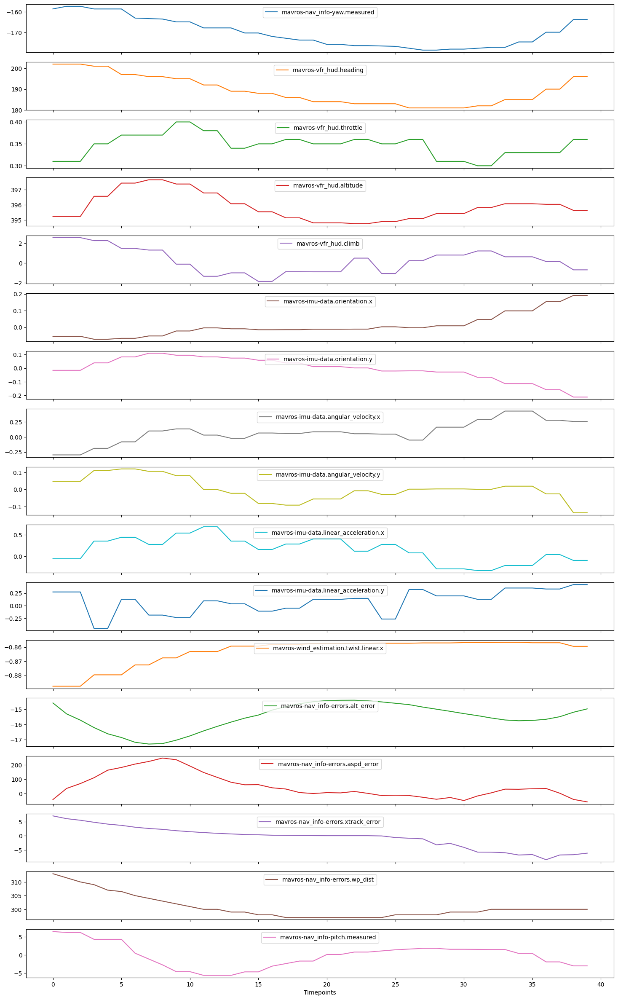

In [15]:
axes = group.drop(["failure_status", "id", "sort"], axis=1)\
    .reset_index(drop=True)\
    .plot(subplots=True, figsize=(18, 30))

for ax in axes:
    ax.legend(loc='upper center')

plt.xlabel("Timepoints")
plt.show()

#### **Nested DataFrame**

* In nested dataframe, for each of the row consist of size 40(window size), corresponding to the 17 features

**1. Merging all the sequences for all flights**

In [123]:
%%time

labels = []
instance = 0
df_nested = None
unused_columns = ["failure_status", "id", "sort"]


for i, flight_name in enumerate(df_dict_rolled.keys()):
    print(f"{i+1}. \t {flight_name}")

    # grouped by id
    grouped = df_dict_rolled[flight_name].groupby('id')

    for file_name, group in grouped:
        df_tmp = group.drop(unused_columns, axis=1).reset_index(drop=True)
        df_tmp["instances"] = instance
        df_tmp["timepoints"] = list(range(len(df_tmp)))
        
        if df_nested is None:
            df_nested = df_tmp
        else:
            df_nested = pd.concat([df_nested, df_tmp]) 
            df_nested = df_nested.reset_index(drop=True)
        
        labels.append(int(flight_name[-1]))
        
        instance += 1


df_nested = df_nested.set_index(["instances", "timepoints"])
labels = np.array(labels)

1. 	 carbonZ_2018-07-18-16-37-39_1_no_failure_label_0
2. 	 carbonZ_2018-10-05-15-55-10_engine_failure_with_emr_traj_label_0
3. 	 carbonZ_2018-10-05-15-55-10_engine_failure_with_emr_traj_label_1
4. 	 carbonZ_2018-10-18-11-06-06_engine_failure_with_emr_traj_label_0
5. 	 carbonZ_2018-10-18-11-06-06_engine_failure_with_emr_traj_label_1
6. 	 carbonZ_2018-10-05-14-37-22_1_no_failure_label_0
7. 	 carbonZ_2018-10-18-11-04-08_1_engine_failure_with_emr_traj_label_0
8. 	 carbonZ_2018-10-18-11-04-08_1_engine_failure_with_emr_traj_label_1
9. 	 carbonZ_2018-07-30-16-39-00_1_engine_failure_label_0
10. 	 carbonZ_2018-07-30-16-39-00_1_engine_failure_label_1
11. 	 carbonZ_2018-09-11-14-22-07_1_engine_failure_label_0
12. 	 carbonZ_2018-09-11-14-22-07_1_engine_failure_label_1
13. 	 carbonZ_2018-07-30-17-10-45_engine_failure_with_emr_traj_label_0
14. 	 carbonZ_2018-07-30-17-10-45_engine_failure_with_emr_traj_label_1
15. 	 carbonZ_2018-09-11-15-05-11_2_no_failure_label_0
16. 	 carbonZ_2018-07-30-17-46-31_en

In [125]:
df_nested

mavros-nav_info-errors.alt_error  \
instances timepoints                                     
0         0                                      -0.66   
          1                                      -0.80   
          2                                      -1.07   
          3                                      -1.15   
          4                                      -1.33   
...                                                ...   
2791      35                                      0.30   
          36                                      0.23   
          37                                      0.15   
          38                                      0.13   
          39                                      0.11   

                      mavros-nav_info-errors.aspd_error  \
instances timepoints                                      
0         0                                 -455.761536   
          1                                 -476.651764   
          2                                 -456.884399   
          3                                 -422.000488   
          4                                 -431.838043   
...                                                 ...   
2791      35                                -408.031067   
          36                                -358.930313   
          37                                -352.682129   
          38                                -352.682129   
          39                                -357.827942   

                      mavros-nav_info-errors.xtrack_error  \
instances timepoints                                        
0         0                                    -29.814545   
          1                                    -25.783993   
          2                                    -20.003454   
          3                                    -18.156500   
          4                                    -14.543348   
...                                                   ...   
2791      35                                     6.736988   
          36                                     6.533125   
          37                                     6.337189   
          38                                     6.266087   
          39                                     6.156582   

                      mavros-nav_info-errors.wp_dist  mavros-vfr_hud.heading  \
instances timepoints                                                           
0         0                                     14.0                   237.0   
          1                                     18.0                   237.0   
          2                                     24.0                   237.0   
          3                                     26.0                   251.0   
          4                                     30.0                   260.0   
...                                              ...                     ...   
2791      35                                    51.0                   288.0   
          36                                    51.0                   288.0   
          37                                    50.0                   296.0   
          38                                    50.0                   296.0   
          39                                    50.0                   302.0   

                      mavros-vfr_hud.throttle  mavros-vfr_hud.altitude  \
instances timepoints                                                     
0         0                              0.18               395.589996   
          1                              0.18               395.589996   
          2                              0.18               395.589996   
          3                              0.15               396.000000   
          4                              0.14               396.309998   
...                                       ...                      ...   
2791      35                             0.48               435.949982  

**In nested univ, it further compresses that, so for each row consist of 40 values corresponding to 17 features**

In [126]:
%%time

df_nested_univ = convert_to(df_nested, to_type="nested_univ")
df_nested_univ

CPU times: user 8.3 s, sys: 156 ms, total: 8.46 s
Wall time: 8.47 s


,mavros-nav_info-errors.alt_error,mavros-nav_info-errors.aspd_error,mavros-nav_info-errors.xtrack_error,mavros-nav_info-errors.wp_dist,mavros-vfr_hud.heading,mavros-vfr_hud.throttle,mavros-vfr_hud.altitude,mavros-vfr_hud.climb,mavros-nav_info-pitch.measured,mavros-wind_estimation.twist.linear.x,mavros-imu-data.orientation.x,mavros-imu-data.orientation.y,mavros-imu-data.angular_velocity.x,mavros-imu-data.angular_velocity.y,mavros-imu-data.linear_acceleration.x,mavros-imu-data.linear_acceleration.y,mavros-nav_info-yaw.measured
instances,,,,,,,,,,,,,,,,,
0,0 -0.660 1 -0.800 2 -1.070 3 -1.15...,0 -455.761536 1 -476.651764 2 -456.88...,0 -29.814545 1 -25.783993 2 -20.00345...,0 14.0 1 18.0 2 24.0 3 26.0 4 ...,0 237.0 1 237.0 2 237.0 3 251....,0 0.18 1 0.18 2 0.18 3 0.15 4 ...,0 395.589996 1 395.589996 2 395.58...,0 3.015022 1 3.015022 2 3.015022 3...,0 3.055814 1 2.909206 2 2.909206 3...,0 -1.218193 1 -1.218193 2 -1.217648 3...,0 0.087681 1 0.087681 2 0.087681 3...,0 -0.385917 1 -0.385917 2 -0.385917 3...,0 -0.084994 1 -0.084994 2 -0.084994 3...,0 -0.308205 1 -0.308205 2 -0.308205 3...,0 -0.735499 1 -0.735499 2 -0.735499 3...,0 0.529559 1 0.529559 2 0.529559 3...,0 -132.508072 1 -122.356827 2 -122.35...
1,0 -1.645 1 -1.880 2 -2.280 3 -2.50...,0 -438.353256 1 -410.271454 2 -364.10...,0 -10.275299 1 -7.836422 2 -4.00584...,0 34.0 1 36.0 2 40.0 3 42.0 4 ...,0 260.0 1 260.0 2 270.0 3 280....,0 0.14 1 0.14 2 0.14 3 0.16 4 ...,0 396.309998 1 396.309998 2 396.98...,0 1.842530 1 1.842530 2 0.646380 3...,0 2.217162 1 2.217162 2 3.408344 3...,0 -1.227921 1 -1.227921 2 -1.254274 3...,0 0.013611 1 0.013611 2 -0.032226 3...,0 -0.374386 1 -0.374386 2 -0.369277 3...,0 0.049216 1 0.049216 2 -0.101741 3...,0 -0.333110 1 -0.333110 2 -0.269193 3...,0 -0.539366 1 -0.539366 2 -0.647239 3...,0 0.460913 1 0.460913 2 -0.215746 3...,0 -99.654175 1 -99.654175 2 -88.57471...
2,0 -2.940 1 -2.980 2 -2.970 3 -2.87...,0 -270.894226 1 -255.978973 2 -256.19...,0 4.969376 1 7.445637 2 8.63237...,0 49.0 1 52.0 2 53.0 3 55.5 4 ...,0 290.0 1 290.0 2 300.0 3 300....,0 0.18 1 0.18 2 0.19 3 0.19 4 ...,0 397.759979 1 397.759979 2 397.75...,0 0.675522 1 0.675522 2 -0.189838 3...,0 1.154791 1 -2.203672 2 -2.203672 3...,0 -1.265027 1 -1.277158 2 -1.277158 3...,0 -0.047711 1 -0.047711 2 -0.075037 3...,0 -0.358794 1 -0.358794 2 -0.364093 3...,0 0.209503 1 0.209503 2 0.077267 3...,0 -0.230816 1 -0.230816 2 -0.300737 3...,0 -0.451106 1 -0.451106 2 -0.519752 3...,0 0.794339 1 0.794339 2 0.706079 3...,0 -79.613251 1 -69.172707 2 -69.17270...
3,0 -2.630 1 -2.440 2 -2.250 3 -1.97...,0 -266.546265 1 -279.333130 2 -296.82...,0 14.883747 1 16.611500 2 18.14292...,0 59.0 1 61.0 2 62.0 3 64.0 4 ...,0 311.0 1 311.0 2 323.0 3 332....,0 0.18 1 0.18 2 0.14 3 0.12 4 ...,0 397.479980 1 397.479980 2 397.06...,0 -1.053717 1 -1.053717 2 -1.186806 3...,0 -2.208956 1 -2.208956 2 -3.129410 3...,0 -1.301928 1 -1.301928 2 -1.324441 3...,0 -0.116694 1 -0.116694 2 -0.124579 3...,0 -0.361178 1 -0.361178 2 -0.302720 3...,0 0.035469 1 0.035469 2 -0.054346 3...,0 -0.280418 1 -0.280418 2 -0.250178 3...,0 -0.254973 1 -0.254973 2 -0.431493 3...,0 0.558979 1 0.558979 2 -0.147100 3...,0 -48.802830 1 -48.802830 2 -36.21803...
4,0 -1.570 1 -1.410 2 -1.210 3 -0.92...,0 -300.003998 1 -274.610046 2 -244.40...,0 22.204082 1 22.712791 2 23.09713...,0 66.0 1 67.0 2 67.0 3 67.0 4 ...,0 343.0 1 343.0 2 351.0 3 351....,0 0.16 1 0.16 2 0.20 3 0.20 4 ...,0 396.350006 1 396.350006 2 395.97...,0 -0.953676 1 -0.953676 2 -1.055751 3...,0 -3.192230 1 -2.132097 2 -0.616090 3...,0 -1.345591 1 -1.356668 2 -1.356668 3...,0 -0.219188 1 -0.219188 2 -0.248480 3...,0 -0.322025 1 -0.322025 2 -0.298574 3...,0 0.328594 1 0.328594 2 -0.223647 3...,0 -0.387154 1 -0.387154 2 -0.373327 3...,0 -0.519752 1 -0.519752 2 -0.441299 3...,0 0.451106 1 0.451106 2 0.225553 3...,0 -27.332699 1 -16.474064 2 -9.00...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2787,0 -0.390 1 -0.320 2 -0.305 3 -0.35...,0 -345.119293 1 -353.970703

#### **Save as .ts file for all flights data**

path - "data/alfa-uav-fault-detection-rolling-v2/alfa-uav-fault-detection-rolling-v2.ts"

In [128]:
%%time

dataset_column = """
This dataset is a pre-processed version of the ALFA Dataset for UAV Fault and Anomaly Detection.
It contains 2792 instances with label 0 and with label 1 mixed. 
Each serie has 40 timepoints of 8 seconds (5Hz).
"""

write_dataframe_to_tsfile(
    data=df_nested_univ,
    path="data/",
    problem_name="alfa-uav-fault-detection-rolling-v2",
    class_label=np.unique(labels),
    class_value_list=labels,
    comment=dataset_column,
    equal_length=True,
    series_length=40,
)

CPU times: user 10 s, sys: 55.8 ms, total: 10.1 s
Wall time: 10.1 s


**2. Create nested df for flights having no failure**

In [129]:
%%time

labels_no_failure = []
instance = 0
df_nested_no_failure = None
unused_columns = ["failure_status", "id", "sort"]


for i, flight_name in enumerate(df_dict_rolled_no_failure.keys()):
    print(f"{i+1}. \t {flight_name}")

    # grouped by id
    grouped = df_dict_rolled_no_failure[flight_name].groupby('id')

    for file_name, group in grouped:
        df_tmp = group.drop(unused_columns, axis=1).reset_index(drop=True)
        df_tmp["instances"] = instance
        df_tmp["timepoints"] = list(range(len(df_tmp)))
        
        if df_nested_no_failure is None:
            df_nested_no_failure = df_tmp
        else:
            df_nested_no_failure = pd.concat([df_nested_no_failure, df_tmp]) 
            df_nested_no_failure = df_nested_no_failure.reset_index(drop=True)
        
        labels_no_failure.append(int(flight_name[-1]))
        
        instance += 1


df_nested_no_failure = df_nested_no_failure.set_index(["instances", "timepoints"])
labels_no_failure = np.array(labels_no_failure)

1. 	 carbonZ_2018-07-18-16-37-39_1_no_failure_label_0
2. 	 carbonZ_2018-10-05-14-37-22_1_no_failure_label_0
3. 	 carbonZ_2018-09-11-15-05-11_2_no_failure_label_0
4. 	 carbonZ_2018-07-30-16-39-00_3_no_failure_label_0
5. 	 carbonZ_2018-09-11-14-41-38_no_failure_label_0
6. 	 carbonZ_2018-10-18-11-08-24_no_failure_label_0
7. 	 carbonZ_2018-09-11-14-16-55_no_failure_label_0
8. 	 carbonZ_2018-10-05-15-52-12_1_no_failure_label_0
9. 	 carbonZ_2018-10-05-15-52-12_2_no_failure_label_0
10. 	 carbonZ_2018-10-05-14-34-20_1_no_failure_label_0
CPU times: user 1.29 s, sys: 799 µs, total: 1.29 s
Wall time: 1.29 s


In [130]:
df_nested_no_failure

mavros-nav_info-errors.alt_error  \
instances timepoints                                     
0         0                                      -0.66   
          1                                      -0.80   
          2                                      -1.07   
          3                                      -1.15   
          4                                      -1.33   
...                                                ...   
483       35                                      0.30   
          36                                      0.23   
          37                                      0.15   
          38                                      0.13   
          39                                      0.11   

                      mavros-nav_info-errors.aspd_error  \
instances timepoints                                      
0         0                                 -455.761536   
          1                                 -476.651764   
          2                                 -456.884399   
          3                                 -422.000488   
          4                                 -431.838043   
...                                                 ...   
483       35                                -408.031067   
          36                                -358.930313   
          37                                -352.682129   
          38                                -352.682129   
          39                                -357.827942   

                      mavros-nav_info-errors.xtrack_error  \
instances timepoints                                        
0         0                                    -29.814545   
          1                                    -25.783993   
          2                                    -20.003454   
          3                                    -18.156500   
          4                                    -14.543348   
...                                                   ...   
483       35                                     6.736988   
          36                                     6.533125   
          37                                     6.337189   
          38                                     6.266087   
          39                                     6.156582   

                      mavros-nav_info-errors.wp_dist  mavros-vfr_hud.heading  \
instances timepoints                                                           
0         0                                     14.0                   237.0   
          1                                     18.0                   237.0   
          2                                     24.0                   237.0   
          3                                     26.0                   251.0   
          4                                     30.0                   260.0   
...                                              ...                     ...   
483       35                                    51.0                   288.0   
          36                                    51.0                   288.0   
          37                                    50.0                   296.0   
          38                                    50.0                   296.0   
          39                                    50.0                   302.0   

                      mavros-vfr_hud.throttle  mavros-vfr_hud.altitude  \
instances timepoints                                                     
0         0                              0.18               395.589996   
          1                              0.18               395.589996   
          2                              0.18               395.589996   
          3                              0.15               396.000000   
          4                              0.14               396.309998   
...                                       ...                      ...   
483       35                             0.48               435.949982  

**In nested univ, it further compresses that, so for each row consist of 40 values corresponding to 17 features**

In [131]:
%%time

df_nested_univ_no_failure = convert_to(df_nested_no_failure, to_type="nested_univ")
df_nested_univ_no_failure

CPU times: user 1.31 s, sys: 3.94 ms, total: 1.31 s
Wall time: 1.32 s


,mavros-nav_info-errors.alt_error,mavros-nav_info-errors.aspd_error,mavros-nav_info-errors.xtrack_error,mavros-nav_info-errors.wp_dist,mavros-vfr_hud.heading,mavros-vfr_hud.throttle,mavros-vfr_hud.altitude,mavros-vfr_hud.climb,mavros-nav_info-pitch.measured,mavros-wind_estimation.twist.linear.x,mavros-imu-data.orientation.x,mavros-imu-data.orientation.y,mavros-imu-data.angular_velocity.x,mavros-imu-data.angular_velocity.y,mavros-imu-data.linear_acceleration.x,mavros-imu-data.linear_acceleration.y,mavros-nav_info-yaw.measured
instances,,,,,,,,,,,,,,,,,
0,0 -0.660 1 -0.800 2 -1.070 3 -1.15...,0 -455.761536 1 -476.651764 2 -456.88...,0 -29.814545 1 -25.783993 2 -20.00345...,0 14.0 1 18.0 2 24.0 3 26.0 4 ...,0 237.0 1 237.0 2 237.0 3 251....,0 0.18 1 0.18 2 0.18 3 0.15 4 ...,0 395.589996 1 395.589996 2 395.58...,0 3.015022 1 3.015022 2 3.015022 3...,0 3.055814 1 2.909206 2 2.909206 3...,0 -1.218193 1 -1.218193 2 -1.217648 3...,0 0.087681 1 0.087681 2 0.087681 3...,0 -0.385917 1 -0.385917 2 -0.385917 3...,0 -0.084994 1 -0.084994 2 -0.084994 3...,0 -0.308205 1 -0.308205 2 -0.308205 3...,0 -0.735499 1 -0.735499 2 -0.735499 3...,0 0.529559 1 0.529559 2 0.529559 3...,0 -132.508072 1 -122.356827 2 -122.35...
1,0 -1.645 1 -1.880 2 -2.280 3 -2.50...,0 -438.353256 1 -410.271454 2 -364.10...,0 -10.275299 1 -7.836422 2 -4.00584...,0 34.0 1 36.0 2 40.0 3 42.0 4 ...,0 260.0 1 260.0 2 270.0 3 280....,0 0.14 1 0.14 2 0.14 3 0.16 4 ...,0 396.309998 1 396.309998 2 396.98...,0 1.842530 1 1.842530 2 0.646380 3...,0 2.217162 1 2.217162 2 3.408344 3...,0 -1.227921 1 -1.227921 2 -1.254274 3...,0 0.013611 1 0.013611 2 -0.032226 3...,0 -0.374386 1 -0.374386 2 -0.369277 3...,0 0.049216 1 0.049216 2 -0.101741 3...,0 -0.333110 1 -0.333110 2 -0.269193 3...,0 -0.539366 1 -0.539366 2 -0.647239 3...,0 0.460913 1 0.460913 2 -0.215746 3...,0 -99.654175 1 -99.654175 2 -88.57471...
2,0 -2.940 1 -2.980 2 -2.970 3 -2.87...,0 -270.894226 1 -255.978973 2 -256.19...,0 4.969376 1 7.445637 2 8.63237...,0 49.0 1 52.0 2 53.0 3 55.5 4 ...,0 290.0 1 290.0 2 300.0 3 300....,0 0.18 1 0.18 2 0.19 3 0.19 4 ...,0 397.759979 1 397.759979 2 397.75...,0 0.675522 1 0.675522 2 -0.189838 3...,0 1.154791 1 -2.203672 2 -2.203672 3...,0 -1.265027 1 -1.277158 2 -1.277158 3...,0 -0.047711 1 -0.047711 2 -0.075037 3...,0 -0.358794 1 -0.358794 2 -0.364093 3...,0 0.209503 1 0.209503 2 0.077267 3...,0 -0.230816 1 -0.230816 2 -0.300737 3...,0 -0.451106 1 -0.451106 2 -0.519752 3...,0 0.794339 1 0.794339 2 0.706079 3...,0 -79.613251 1 -69.172707 2 -69.17270...
3,0 -2.630 1 -2.440 2 -2.250 3 -1.97...,0 -266.546265 1 -279.333130 2 -296.82...,0 14.883747 1 16.611500 2 18.14292...,0 59.0 1 61.0 2 62.0 3 64.0 4 ...,0 311.0 1 311.0 2 323.0 3 332....,0 0.18 1 0.18 2 0.14 3 0.12 4 ...,0 397.479980 1 397.479980 2 397.06...,0 -1.053717 1 -1.053717 2 -1.186806 3...,0 -2.208956 1 -2.208956 2 -3.129410 3...,0 -1.301928 1 -1.301928 2 -1.324441 3...,0 -0.116694 1 -0.116694 2 -0.124579 3...,0 -0.361178 1 -0.361178 2 -0.302720 3...,0 0.035469 1 0.035469 2 -0.054346 3...,0 -0.280418 1 -0.280418 2 -0.250178 3...,0 -0.254973 1 -0.254973 2 -0.431493 3...,0 0.558979 1 0.558979 2 -0.147100 3...,0 -48.802830 1 -48.802830 2 -36.21803...
4,0 -1.570 1 -1.410 2 -1.210 3 -0.92...,0 -300.003998 1 -274.610046 2 -244.40...,0 22.204082 1 22.712791 2 23.09713...,0 66.0 1 67.0 2 67.0 3 67.0 4 ...,0 343.0 1 343.0 2 351.0 3 351....,0 0.16 1 0.16 2 0.20 3 0.20 4 ...,0 396.350006 1 396.350006 2 395.97...,0 -0.953676 1 -0.953676 2 -1.055751 3...,0 -3.192230 1 -2.132097 2 -0.616090 3...,0 -1.345591 1 -1.356668 2 -1.356668 3...,0 -0.219188 1 -0.219188 2 -0.248480 3...,0 -0.322025 1 -0.322025 2 -0.298574 3...,0 0.328594 1 0.328594 2 -0.223647 3...,0 -0.387154 1 -0.387154 2 -0.373327 3...,0 -0.519752 1 -0.519752 2 -0.441299 3...,0 0.451106 1 0.451106 2 0.225553 3...,0 -27.332699 1 -16.474064 2 -9.00...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
479,0 -0.390 1 -0.320 2 -0.305 3 -0.35...,0 -345.119293 1 -353.970703 

#### **Save as .ts file for no failure data**

path - "data/alfa-uav-fault-detection-rolling-no-failure-v2/alfa-uav-fault-detection-rolling-no-failure-v2.ts"

In [133]:
%%time

dataset_column = """
This dataset is a pre-processed version of the ALFA Dataset for UAV Fault and Anomaly Detection.
It contains 484 instances with label 0 and 196 instances with label 1. 
Each serie has 40 timepoints of 8 seconds (5Hz).
"""

write_dataframe_to_tsfile(
    data=df_nested_univ_no_failure,
    path="data/",
    problem_name="alfa-uav-fault-detection-rolling-no-failure-v2",
    class_label=np.unique(labels_no_failure),
    class_value_list=labels_no_failure,
    comment=dataset_column,
    equal_length=True,
    series_length=40,
)

CPU times: user 1.74 s, sys: 8.31 ms, total: 1.74 s
Wall time: 1.75 s


In [132]:
np.unique(labels_no_failure)

array([0])

**3. Create nested df for failure only flights**

In [135]:
%%time

labels_failure_only = []
instance = 0
df_nested_failure_only = None
unused_columns = ["failure_status", "id", "sort"]


for i, flight_name in enumerate(df_dict_rolled_failure_only.keys()):
    print(f"{i+1}. \t {flight_name}")

    # grouped by id
    grouped = df_dict_rolled_failure_only[flight_name].groupby('id')

    for file_name, group in grouped:
        df_tmp = group.drop(unused_columns, axis=1).reset_index(drop=True)
        df_tmp["instances"] = instance
        df_tmp["timepoints"] = list(range(len(df_tmp)))
        
        if df_nested_failure_only is None:
            df_nested_failure_only = df_tmp
        else:
            df_nested_failure_only = pd.concat([df_nested_failure_only, df_tmp]) 
            df_nested_failure_only = df_nested_failure_only.reset_index(drop=True)
        
        labels_failure_only.append(int(flight_name[-1]))
        
        instance += 1


df_nested_failure_only = df_nested_failure_only.set_index(["instances", "timepoints"])
labels_failure_only = np.array(labels_failure_only)

1. 	 carbonZ_2018-10-05-15-55-10_engine_failure_with_emr_traj_label_0
2. 	 carbonZ_2018-10-05-15-55-10_engine_failure_with_emr_traj_label_1
3. 	 carbonZ_2018-10-18-11-06-06_engine_failure_with_emr_traj_label_0
4. 	 carbonZ_2018-10-18-11-06-06_engine_failure_with_emr_traj_label_1
5. 	 carbonZ_2018-10-18-11-04-08_1_engine_failure_with_emr_traj_label_0
6. 	 carbonZ_2018-10-18-11-04-08_1_engine_failure_with_emr_traj_label_1
7. 	 carbonZ_2018-07-30-16-39-00_1_engine_failure_label_0
8. 	 carbonZ_2018-07-30-16-39-00_1_engine_failure_label_1
9. 	 carbonZ_2018-09-11-14-22-07_1_engine_failure_label_0
10. 	 carbonZ_2018-09-11-14-22-07_1_engine_failure_label_1
11. 	 carbonZ_2018-07-30-17-10-45_engine_failure_with_emr_traj_label_0
12. 	 carbonZ_2018-07-30-17-10-45_engine_failure_with_emr_traj_label_1
13. 	 carbonZ_2018-07-30-17-46-31_engine_failure_with_emr_traj_label_0
14. 	 carbonZ_2018-07-30-17-46-31_engine_failure_with_emr_traj_label_1
15. 	 carbonZ_2018-07-18-16-37-39_2_engine_failure_with_emr

**After the nested thing, we get 2308 instances, for each instance there are 40 rows for all the flights**

In [136]:
df_nested_failure_only

mavros-nav_info-yaw.measured  \
instances timepoints                                 
0         0                              19.211409   
          1                              16.294085   
          2                              13.376761   
          3                              10.827509   
          4                              10.827509   
...                                            ...   
2307      35                            177.239182   
          36                           -177.508148   
          37                           -177.508148   
          38                           -170.928329   
          39                           -170.928329   

                      mavros-imu-data.orientation.x  \
instances timepoints                                  
0         0                                0.000000   
          1                                0.079204   
          2                                0.079204   
          3                                0.170534   
          4                                0.170534   
...                                             ...   
2307      35                               0.323774   
          36                               0.323774   
          37                               0.323774   
          38                               0.323553   
          39                               0.323553   

                      mavros-imu-data.orientation.y  \
instances timepoints                                  
0         0                                0.000000   
          1                                0.091610   
          2                                0.091610   
          3                                0.156219   
          4                                0.156219   
...                                             ...   
2307      35                              -0.145554   
          36                              -0.145554   
          37                              -0.145554   
          38                              -0.213809   
          39                              -0.213809   

                      mavros-imu-data.angular_velocity.x  \
instances timepoints                                       
0         0                                     0.000000   
          1                                     0.323591   
          2                                     0.323591   
          3                                    -0.664730   
          4                                    -0.664730   
...                                                  ...   
2307      35                                    0.215005   
          36                                    0.215005   
          37                                    0.215005   
          38                                   -0.009964   
          39                                   -0.009964   

                      mavros-imu-data.angular_velocity.y  \
instances timepoints                                       
0         0                                     0.000000   
          1                                    -0.134817   
          2                                    -0.134817   
          3                                     0.159173   
          4                                     0.159173   
...                                                  ...   
2307      35                                   -0.253787   
          36                                   -0.253787   
          37                                   -0.253787   
          38                                   -0.251224   
          39                                   -0.251224   

                      mavros-imu-data.linear_acceleration.x  \
instances timepoints                                          
0         0                                        0.000000   
          1                                       -1.431771   
          2                                       -1.431771   
          

**In nested univ, it further compresses that, so for each row consist of 40 values corresponding to 17 features**

In [137]:
%%time

df_nested_univ_failure_only = convert_to(df_nested_failure_only, to_type="nested_univ")
df_nested_univ_failure_only

CPU times: user 7.05 s, sys: 48.2 ms, total: 7.1 s
Wall time: 7.1 s


,mavros-nav_info-yaw.measured,mavros-imu-data.orientation.x,mavros-imu-data.orientation.y,mavros-imu-data.angular_velocity.x,mavros-imu-data.angular_velocity.y,mavros-imu-data.linear_acceleration.x,mavros-imu-data.linear_acceleration.y,mavros-vfr_hud.heading,mavros-vfr_hud.throttle,mavros-vfr_hud.altitude,mavros-vfr_hud.climb,mavros-nav_info-pitch.measured,mavros-nav_info-errors.alt_error,mavros-nav_info-errors.aspd_error,mavros-nav_info-errors.xtrack_error,mavros-nav_info-errors.wp_dist,mavros-wind_estimation.twist.linear.x
instances,,,,,,,,,,,,,,,,,
0,0 19.211409 1 16.294085 2 13.37676...,0 0.000000 1 0.079204 2 0.079204 3...,0 0.000000 1 0.091610 2 0.091610 3...,0 0.000000 1 0.323591 2 0.323591 3...,0 0.000000 1 -0.134817 2 -0.134817 3...,0 0.000000 1 -1.431771 2 -1.431771 3...,0 0.000000e+00 1 1.931910e+00 2 1....,0 0.0 1 13.0 2 13.0 3 10....,0 0.00 1 0.41 2 0.41 3 0.27 4 ...,0 0.000000 1 396.029999 2 396.02...,0 0.000000 1 6.374585 2 6.374585 3...,0 -0.033102 1 1.298095 2 2.62929...,0 -0.680 1 -0.980 2 -1.670 3 -2.27...,0 -1117.021973 1 -1040.091156 2 -932...,0 -26.744854 1 -513.090332 2 -514.70...,0 15.0 1 19.5 2 26.0 3 31....,0 -0.897313 1 -0.897313 2 -0.924513 3...
1,0 14.902246 1 14.902246 2 12.27596...,0 0.201686 1 0.217997 2 0.217997 3...,0 0.166919 1 0.149188 2 0.149188 3...,0 0.009782 1 -0.085254 2 -0.085254 3...,0 0.112500 1 0.102042 2 0.102042 3...,0 -1.696550 1 -1.794617 2 -1.794617 3...,0 -5.099458e-01 1 -1.078732e-01 2 -1....,0 14.0 1 12.0 2 12.0 3 7....,0 0.14 1 0.03 2 0.03 3 0.04 4 ...,0 398.089996 1 398.399994 2 398.39...,0 4.055399 1 3.572646 2 3.572646 3...,0 1.118899 1 1.118899 2 -2.44900...,0 -3.060 1 -3.270 2 -3.370 3 -3.17...,0 -799.785400 1 -799.785400 2 -755.71...,0 -517.066193 1 -517.530701 2 -518.21...,0 40.0 1 44.0 2 49.5 3 56....,0 -0.925607 1 -0.830610 2 -0.830610 3...
2,0 7.266452 1 3.307002 2 3.30700...,0 0.281515 1 0.281515 2 0.302761 3...,0 0.138440 1 0.138440 2 0.145250 3...,0 -0.096977 1 -0.096977 2 -0.002625 3...,0 0.001899 1 0.001899 2 -0.084184 3...,0 -1.961330 1 -1.961330 2 -1.892683 3...,0 9.007262e-16 1 9.007262e-16 2 -3....,0 3.0 1 3.0 2 357.0 3 357....,0 0.10 1 0.10 2 0.18 3 0.18 4 ...,0 397.139984 1 397.139984 2 395.47...,0 -2.061059 1 -2.061059 2 -4.530896 3...,0 -7.835460 1 -11.140450 2 -11.14045...,0 -2.230 1 -1.550 2 -0.720 3 0.02...,0 -766.732971 1 -747.445679 2 -737.95...,0 -519.194519 1 -519.168823 2 -518.98...,0 65.0 1 69.0 2 74.0 3 77....,0 -0.622166 1 -0.549259 2 -0.549259 3...
3,0 -8.789038 1 -15.817052 2 -15.81705...,0 0.286723 1 0.268781 2 0.268781 3...,0 0.132796 1 0.145930 2 0.145930 3...,0 0.051965 1 -0.066655 2 -0.066655 3...,0 -0.154827 1 -0.256952 2 -0.256952 3...,0 -1.814230 1 -1.382738 2 -1.382738 3...,0 0.137293 1 -0.068647 2 -0.068647 3...,0 351.0 1 344.0 2 344.0 3 334....,0 0.25 1 0.35 2 0.35 3 0.46 4 ...,0 393.690002 1 391.699982 2 391.69...,0 -5.998663 1 -7.665854 2 -7.665854 3...,0 -15.766428 1 -15.135139 2 -15.13513...,0 2.175 1 3.275 2 4.300 3 5.25...,0 -741.428589 1 -742.512329 2 -763.81...,0 -517.409485 1 -516.343872 2 -514.94...,0 86.5 1 91.0 2 95.5 3 100....,0 -0.479228 1 -0.453406 2 -0.453406 3...
4,0 -25.148483 1 -34.717232 2 -34.71723...,0 0.200891 1 0.200891 2 0.200891 3...,0 0.229097 1 0.229097 2 0.229097 3...,0 -0.044402 1 -0.044402 2 -0.044402 3...,0 -0.372756 1 -0.372756 2 -0.372756 3...,0 -0.735499 1 -0.735499 2 -0.735499 3...,0 0.186326 1 0.186326 2 0.186326 3...,0 325.0 1 325.0 2 325.0 3 312....,0 0.53 1 0.53 2 0.53 3 0.57 4 ...,0 387.720001 1 387.720001 2 387.72...,0 -7.210068 1 -7.210068 2 -7.210068 3...,0 -11.915971 1 -8.609779 2 -8.60977...,0 7.160 1 7.710 2 8.470 3 8.80...,0 -810.597778 1 -826.925751 2 -830.40...,0 -508.134705 1 -506.139801 2 -502.44...,0 110.0 1 113.0 2 118.0 3 121....,0 -0.441110 1 -0.435884 2 -0.435884 3...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2303,0 91.447617 1 92.156937 2 92.15693...,0 -0.000964 1 -0.000964 2 -0.008005 3...,0 -0.000684 1 -0.000684 2 -0.027700 3...,0 0.008254

#### **Save as .ts file for failure only flight data**

path - "data/alfa-uav-fault-detection-rolling-failure-only-v2/alfa-uav-fault-detection-rolling-failure-only-v2.ts"

In [142]:
%%time

dataset_column = """
This dataset is a pre-processed version of the ALFA Dataset for UAV Fault and Anomaly Detection.
It contains 2307 instances with label 0 and 196 instances with label 1. 
Each serie has 40 timepoints of 8 seconds (5Hz).
"""

write_dataframe_to_tsfile(
    data=df_nested_univ_failure_only,
    path="data/",
    problem_name="alfa-uav-fault-detection-rolling-failure-only-v2",
    class_label=np.unique(labels_failure_only),
    class_value_list=labels_failure_only,
    comment=dataset_column,
    equal_length=True,
    series_length=40,
)

CPU times: user 8.04 s, sys: 55.1 ms, total: 8.1 s
Wall time: 8.12 s


#### **EDA on Saved Data**

In [20]:
# custom functions to timeseries plot
def tsplot(timepoints, 
           values, 
           n=20, 
           percentile_min=1, 
           percentile_max=99, 
           color='tab:blue', 
           plot_mean=True, 
           plot_median=False, 
           line_color='k', 
           **kwargs):
    # calculate the lower and upper percentile groups, skipping 50 percentile
    perc1 = np.percentile(values, np.linspace(percentile_min, 50, num=n, endpoint=False), axis=0)
    perc2 = np.percentile(values, np.linspace(50, percentile_max, num=n+1)[1:], axis=0)

    if 'alpha' in kwargs:
        alpha = kwargs.pop('alpha')
    else:
        alpha = 1/n
    
    if "ax" in kwargs:
        ax = kwargs.pop('ax')
    
    # fill lower and upper percentile groups
    for p1, p2 in zip(perc1, perc2):
        ax.fill_between(timepoints, p1, p2, alpha=alpha, color=color, edgecolor=None)


    if plot_mean:
        ax.plot(timepoints, np.mean(values, axis=0), color=line_color) #, label="mean")


    if plot_median:
        ax.plot(timepoints, np.median(values, axis=0), color=line_color) #, label="median")
    
    return ax

In [21]:
df_file_name = "sliding_window-preprocessed_median-resampling_feature-selection_rolling_v2.pkl"

#with open(os.path.join("data/alfa-uav-fault-detection", df_file_name), 'rb') as f:
with open(df_file_name, 'rb') as f:
    dataset = dill.load(f)
    columns = dataset[list(dataset.keys())[0]].columns.difference(['failure_status', 'id', 'sort'])

**Load the Latest Rolled Model**

In [170]:
from sktime.datasets import load_from_tsfile

X, y = load_from_tsfile("data/alfa-uav-fault-detection-rolling-v2/alfa-uav-fault-detection-rolling-v2.ts", return_y=True, return_data_type="numpy3D")
X.shape, y.shape

((2792, 17, 40), (2792,))

**Normalize the Data**

In [171]:
# Scale the instances
X_scaled = []
X = np.swapaxes(X, 1, 2)

for i in range(X.shape[0]):
    scaler = StandardScaler()
    X_scaled.append(
        scaler.fit_transform(X[i])
    )

X_scaled = np.array(X_scaled)
X_scaled = np.swapaxes(X_scaled, 1, 2)
X_scaled.shape

(2792, 17, 40)

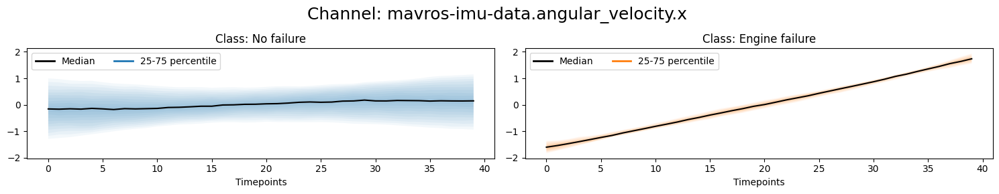

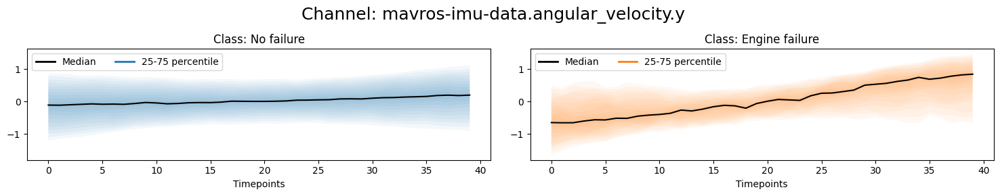

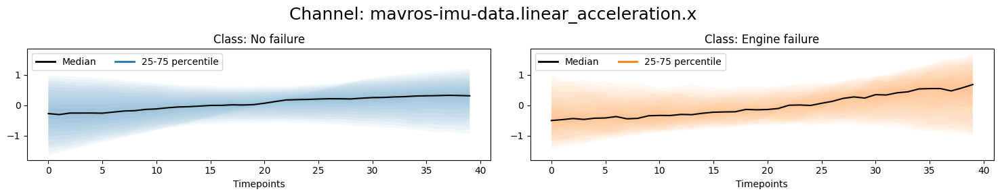

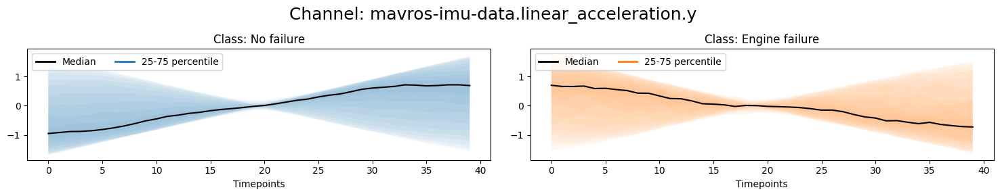

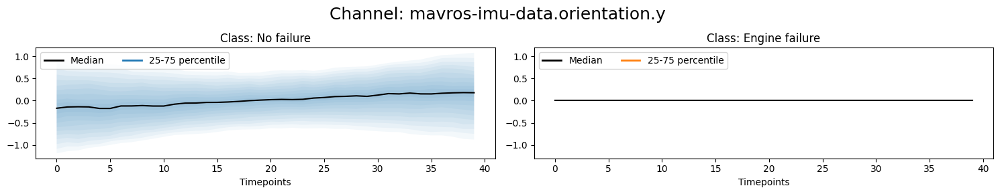

...

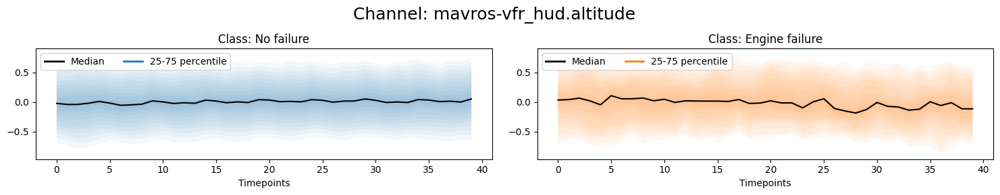

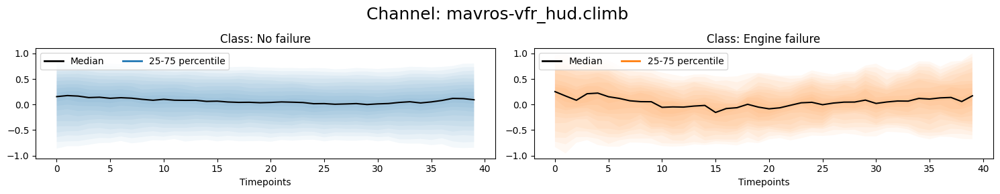

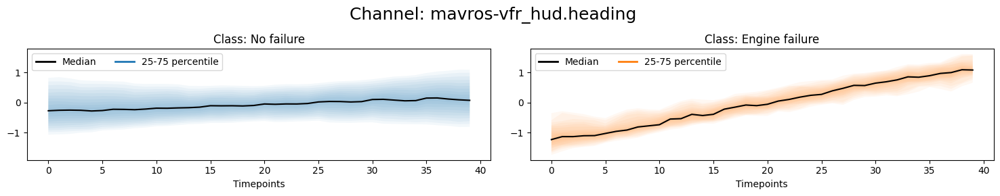

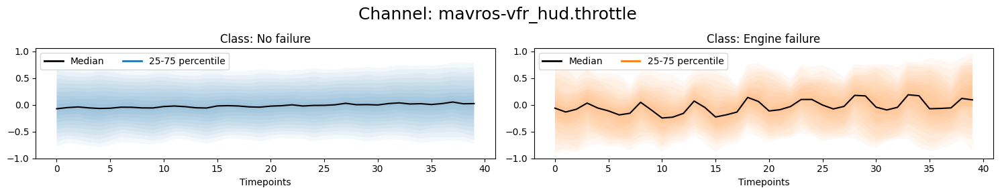

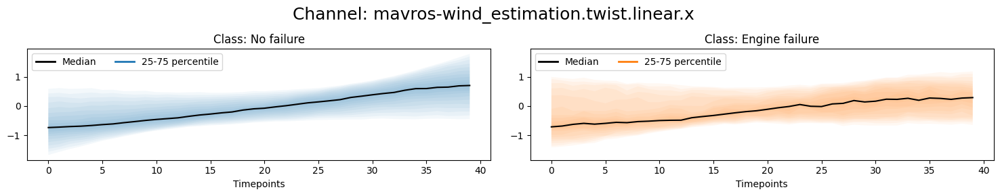

ignored_indices: [4, 6, 7, 8, 9]
CPU times: user 4 s, sys: 2.36 s, total: 6.36 s
Wall time: 3.58 s


In [174]:
%%time

label_dict = {
    "0": "No failure",
    "1": "Engine failure" 
}

ignored_indices = []

ignored_columns = [
    'mavros-imu-data.orientation.x', 
    'mavros-nav_info-errors.alt_error',
    'mavros-nav_info-errors.aspd_error',
    'mavros-nav_info-errors.wp_dist', 
    'mavros-nav_info-errors.xtrack_error',
]

for i, feature_col in zip(range(X_scaled.shape[1]), columns):
    if feature_col in ignored_columns:
        ignored_indices.append(i)
        continue
    
    fig, axs = plt.subplots(1, 2, sharex=True, sharey=True, figsize=(15, 3))
    axs = axs.flatten()
    
    plt.subplots_adjust(hspace=0.5)
    plt.suptitle(f"Channel: {feature_col} ", fontsize=18, y=0.95)
    
    for k, label in enumerate(["0", "1"]):
        color = "tab:blue" if (label == "0") else "tab:orange"
        axs[k].set_xlabel("Timepoints")
        # axs[k].set_ylabel(feature_col)
    
        timepoints = list(range(0, X_scaled.shape[2], 1))
        values = X_scaled[np.where(y == label)[0], i, :]
        
        percentile_min=25
        percentile_max=75

        tsplot(timepoints=timepoints, 
               values=values, 
               n=10,
               plot_mean=False, 
               plot_median=True, 
               alpha=0.05, 
               color=color,
               percentile_min=25, 
               percentile_max=75,
               ax=axs[k])
        
        custom_legend_lines = [Line2D([0], [0], color="black", lw=2),
                        Line2D([0], [0], color=color, lw=2)]

        axs[k].legend(custom_legend_lines, 
                      ["Median", f"{percentile_min}-{percentile_max} percentile"], 
                      loc="upper left", 
                      ncol=2)
        
        axs[k].set_title(f"Class: {label_dict[label]}")
        axs[k].yaxis.set_tick_params(labelbottom=True)
        
    
    plt.tight_layout()
    plt.show()

print("ignored_indices:", ignored_indices)

## **Merge Flight dfs having actual values, after z score normalization**

* Merge all the dataframes to create df_univ
* Create sequences of length 40
* Do the above approach, with or without z score

**Create Sequences from dataframe**

In [13]:
def create_sequences(dataframe, sequence_length=40, step_size=5):
    sequences = []
    for start in range(0, len(dataframe) - sequence_length + 1, step_size):
        end = start + sequence_length
        sequence = dataframe.iloc[start:end].values
        sequences.append(sequence)

    sequences_ = np.array(sequences)

    return sequences_, sequences_.shape[0]

**1. Create Sequence for no-failure flights**

In [19]:
%%time
import time

df_seq_no_failure = None
window_size = 40
steps = 5
sequences_count_no_failure = 0

df_columns = list(df_dict_with_failure[list(df_dict_with_failure.keys())[0]].columns)

# df_dict_with_Failure is a df dict that contains df having failures
for i, flight_name in enumerate(df_dict_with_failure.keys()):
    dfx = df_dict_with_failure[flight_name].copy()
    dfx = dfx.drop("failure_status", axis='columns')

    if "no_failure" in flight_name:
        print("Flight:", flight_name)

        sequences,sequence_count  = create_sequences(dfx, sequence_length = window_size, step_size=steps)
        sequences_count_no_failure += sequence_count 

        if df_seq_no_failure is None:
            df_seq_no_failure = sequences
        else:
            df_seq_no_failure = np.concatenate((df_seq_no_failure,sequences), axis=0)

        #df_seq_no_failure.append(sequences)
        # dfx_0 = dfx.copy()

        # #print([i] * len(dfx_0))
        # dfx_0["id"] = [i] * len(dfx_0)
        
        # print(dfx_0["id"].shape)
        
        # #print("dfx_0.columns:", dfx_0.columns)
        
        # # rolling statistics for smoothening the timeseries data
        # dfx_0_rolled = roll_time_series(
        #     df_or_dict=dfx_0,
        #     column_id="id",
        #     rolling_direction=steps,
        #     max_timeshift=(window_size-1),
        #     min_timeshift=(window_size-1),
        #     n_jobs=4
        # )
        
        # print(time.time() - t)
        
        # df_dict_rolled[f"{flight_name}_label_0"] = dfx_0_rolled
        # #print(dfx_0_rolled['id'])

    
    # for engine failure condition, it 
    # elif "engine_failure" in flight_name:
    #     # gives the position of first max value in the column, i.e the time where the failure happens
    #     idx = dfx[failure_column].ne(0).idxmax()
    #     # creates a df having timestamps till the failure happens
        
    #     dfx_0 = dfx[dfx.index < idx]
    #     # dfx_0["id"] = [i] * len(dfx_0)


    #     if len(dfx_0) > 0:
    #         dfx_0_rolled = roll_time_series(
    #             df_or_dict=dfx_0,
    #             column_id="id",
    #             rolling_direction=steps,
    #             max_timeshift=(window_size-1),
    #             min_timeshift=(window_size-1),
    #             n_jobs=4
    #         )
    #         # creates an instance till no failure occurs
    #         df_dict_rolled[f"{flight_name}_label_0"] = dfx_0_rolled


    #     # where the failure occurs
    #     dfx_1 = dfx[dfx.index >= idx]
    #     dfx_1["id"] = [i] * len(dfx_1)

    #     if len(dfx_1) > 0:
    #         dfx_1_rolled = roll_time_series(
    #             df_or_dict=dfx_1,
    #             column_id="id",
    #             rolling_direction=steps,
    #             max_timeshift=(window_size-1), # window size to be evaluated
    #             min_timeshift=(window_size-1), # window size to be evaluated
    #             n_jobs=4 # number of paralle process or CPU cores to be used
    #         )
            
    #         # df_dict_rolled[f"{flight_name}_label_1"] = dfx_1_rolled

# convert the all x into numpy array
#df_seq_no_failure = np.array(df_seq_no_failure)


Flight: carbonZ_2018-07-18-16-37-39_1_no_failure
Flight: carbonZ_2018-10-05-14-37-22_1_no_failure
Flight: carbonZ_2018-09-11-15-05-11_2_no_failure
Flight: carbonZ_2018-07-30-16-39-00_3_no_failure
Flight: carbonZ_2018-09-11-14-41-38_no_failure
Flight: carbonZ_2018-10-18-11-08-24_no_failure
Flight: carbonZ_2018-09-11-14-16-55_no_failure
Flight: carbonZ_2018-10-05-15-52-12_1_no_failure
Flight: carbonZ_2018-10-05-15-52-12_2_no_failure
Flight: carbonZ_2018-10-05-14-34-20_1_no_failure
CPU times: user 24.2 ms, sys: 66 µs, total: 24.3 ms
Wall time: 23.4 ms


**Save no failure data as npy**

In [11]:
import numpy as np

# Assuming x and y are your numpy arrays
#x = np.random.rand(484, 40, 17)  # Example x array
#y = np.random.rand(484, 1)       # Example y array

# Save x and y arrays to .npy files
#np.save('alfa_dataset_no_failure_sequence_X.npy', df_seq_no_failure)

#np.save('y_dataset.npy', y)
# Load the arrays from the .npy files
x_seq_no_failure = np.load('alfa_dataset_no_failure_sequence_X.npy')

print("Datasets loaded successfully.")
print(f"x shape: {x_seq_no_failure.shape}")
#print(f"y shape: {y_loaded.shape}")
y_seq_no_failure = np.array([0]*len(x_seq_no_failure))
y_seq_no_failure.shape

Datasets loaded successfully.
x shape: (484, 40, 17)


(484,)

**2. Create Sequence where failure occurs in flights**

In [80]:
%%time

import time

# for failure only flights
df_seq_failure_only = None
window_size = 40
steps = 5
sequences_count_failure_only = 0

y_seq_failure_only = []
df_columns = list(df_dict_with_failure[list(df_dict_with_failure.keys())[0]].columns)

# df_dict_with_Failure is a df dict that contains df having failures
for i, flight_name in enumerate(df_dict_with_failure.keys()):
    
    dfx = df_dict_with_failure[flight_name].copy()
    
    # for engine failure condition, it 
    if "engine_failure" in flight_name:
        print(flight_name)
        # gives the position of first max value in the column, i.e the time where the failure happens
        idx = dfx[failure_column].ne(0).idxmax()
        # drop the failure status column
        dfx = dfx.drop("failure_status", axis='columns')

        # creates a df having timestamps till the failure happens        
        dfx_0 = dfx[dfx.index < idx]
        # dfx_0["id"] = [i] * len(dfx_0)
        # no failure sequence of labels 0
        if len(dfx_0) > 0:
            sequences, sequence_count = create_sequences(dfx_0, sequence_length = window_size, step_size=steps)
            sequences_count_failure_only += sequence_count 

            if df_seq_failure_only is None:
                df_seq_failure_only = sequences
            else:
                df_seq_failure_only = np.concatenate((df_seq_failure_only, sequences), axis=0)

            # no failure labels
            for seq in range(sequence_count):
                y_seq_failure_only.append(0)
            

        # where the failure occurs
        # failure only sequence labels 1
        dfx_1 = dfx[dfx.index >= idx]
        #dfx_1["id"] = [i] * len(dfx_1)

        if len(dfx_1) > 0:
            sequences,sequence_count = create_sequences(dfx_1, sequence_length = window_size, step_size=steps)
            sequences_count_failure_only += sequence_count 

            if df_seq_failure_only is None:
                df_seq_failure_only = sequences
            else:
                df_seq_failure_only = np.concatenate((df_seq_failure_only, sequences), axis=0)

            # failure labels
            for seq in range(sequence_count):
                y_seq_failure_only.append(1)

y_seq_failure_only = np.array(y_seq_failure_only)
print(y_seq_failure_only.shape)
# convert the all x into numpy array
#df_seq_no_failure = np.array(df_seq_no_failure)


carbonZ_2018-10-05-15-55-10_engine_failure_with_emr_traj
carbonZ_2018-10-18-11-06-06_engine_failure_with_emr_traj
carbonZ_2018-10-18-11-04-08_1_engine_failure_with_emr_traj
carbonZ_2018-07-30-16-39-00_1_engine_failure
carbonZ_2018-09-11-14-22-07_1_engine_failure
carbonZ_2018-07-30-17-10-45_engine_failure_with_emr_traj
carbonZ_2018-07-30-17-46-31_engine_failure_with_emr_traj
carbonZ_2018-07-18-16-37-39_2_engine_failure_with_emr_traj
carbonZ_2018-07-18-15-53-31_1_engine_failure
carbonZ_2018-10-18-11-04-08_2_engine_failure_with_emr_traj
carbonZ_2018-07-30-16-29-45_engine_failure_with_emr_traj
carbonZ_2018-09-11-14-22-07_2_engine_failure
carbonZ_2018-10-05-16-04-46_engine_failure_with_emr_traj
carbonZ_2018-09-11-11-56-30_engine_failure
carbonZ_2018-10-05-15-52-12_3_engine_failure_with_emr_traj
carbonZ_2018-07-30-17-36-35_engine_failure_with_emr_traj
carbonZ_2018-10-18-11-03-57_engine_failure_with_emr_traj
carbonZ_2018-07-30-17-20-01_engine_failure_with_emr_traj
carbonZ_2018-07-18-15-53-31_

**Save flight sequence data for failure only cases**

In [82]:
import numpy as np

# Assuming x and y are your numpy arrays
#x = np.random.rand(484, 40, 17)  # Example x array
#y = np.random.rand(484, 1)       # Example y array

# Save x and y arrays to .npy files
np.save('alfa_dataset_failure_only_sequence_X.npy', df_seq_failure_only)
np.save('alfa_dataset_failure_only_sequence_y.npy', y_seq_failure_only)
#np.save('y_dataset.npy', y)
# Load the arrays from the .npy files
x_seq_failure_only = np.load('alfa_dataset_failure_only_sequence_X.npy')
y_seq_failure_only = np.load('alfa_dataset_failure_only_sequence_y.npy')

print("Datasets loaded successfully.")
print(f"x shape: {x_seq_failure_only.shape}")
print(f"y shape: {y_seq_failure_only.shape}")


Datasets loaded successfully.
x shape: (2308, 40, 17)
y shape: (2308,)


**3. Create sequences for all the flights**

In [93]:
%%time
import time

# for all flights
df_seq = None

window_size = 40
steps = 5
sequences_count_all = 0
y_seq = []
df_columns = list(df_dict_with_failure[list(df_dict_with_failure.keys())[0]].columns)

# df_dict_with_Failure is a df dict that contains df having failures
for i, flight_name in enumerate(df_dict_with_failure.keys()):
    
    dfx = df_dict_with_failure[flight_name].copy()
    
    # for no failure condition
    if "no_failure" in flight_name:
        dfx = dfx.drop("failure_status", axis='columns')

        print("Flight:", flight_name)

        sequences,sequence_count  = create_sequences(dfx, sequence_length = window_size, step_size=steps)
        sequences_count_all += sequence_count 

        if df_seq is None:
            df_seq = sequences
        else:
            df_seq = np.concatenate((df_seq, sequences), axis=0)

        # no failure labels
        for seq in range(sequence_count):
            y_seq.append(0)


    # for engine failure condition, it 
    elif "engine_failure" in flight_name:

        print("Flight: ",flight_name)
        # gives the position of first max value in the column, i.e the time where the failure happens
        idx = dfx[failure_column].ne(0).idxmax()
        # drop the failure status column
        dfx = dfx.drop("failure_status", axis='columns')

        # creates a df having timestamps till the failure happens        
        dfx_0 = dfx[dfx.index < idx]
        # dfx_0["id"] = [i] * len(dfx_0)
        # no failure sequence of labels 0
        if len(dfx_0) > 0:
            sequences, sequence_count = create_sequences(dfx_0, sequence_length = window_size, step_size=steps)
            sequences_count_all += sequence_count 

            if df_seq is None:
                df_seq = sequences
            else:
                df_seq = np.concatenate((df_seq, sequences), axis=0)

            # no failure labels
            for seq in range(sequence_count):
                y_seq.append(0)
            

        # where the failure occurs
        # failure only sequence labels 1
        dfx_1 = dfx[dfx.index >= idx]
        #dfx_1["id"] = [i] * len(dfx_1)

        if len(dfx_1) > 0:
            sequences,sequence_count = create_sequences(dfx_1, sequence_length = window_size, step_size=steps)
            sequences_count_all += sequence_count 

            if df_seq is None:
                df_seq = sequences
            else:
                df_seq = np.concatenate((df_seq, sequences), axis=0)

            # failure labels
            for seq in range(sequence_count):
                y_seq.append(1)

y_seq = np.array(y_seq)
print(y_seq.shape)


Flight: carbonZ_2018-07-18-16-37-39_1_no_failure
Flight:  carbonZ_2018-10-05-15-55-10_engine_failure_with_emr_traj
Flight:  carbonZ_2018-10-18-11-06-06_engine_failure_with_emr_traj
Flight: carbonZ_2018-10-05-14-37-22_1_no_failure
Flight:  carbonZ_2018-10-18-11-04-08_1_engine_failure_with_emr_traj
Flight:  carbonZ_2018-07-30-16-39-00_1_engine_failure
Flight:  carbonZ_2018-09-11-14-22-07_1_engine_failure
Flight:  carbonZ_2018-07-30-17-10-45_engine_failure_with_emr_traj
Flight: carbonZ_2018-09-11-15-05-11_2_no_failure
Flight:  carbonZ_2018-07-30-17-46-31_engine_failure_with_emr_traj
Flight: carbonZ_2018-07-30-16-39-00_3_no_failure
Flight:  carbonZ_2018-07-18-16-37-39_2_engine_failure_with_emr_traj
Flight:  carbonZ_2018-07-18-15-53-31_1_engine_failure
Flight:  carbonZ_2018-10-18-11-04-08_2_engine_failure_with_emr_traj
Flight: carbonZ_2018-09-11-14-41-38_no_failure
Flight: carbonZ_2018-10-18-11-08-24_no_failure
Flight: carbonZ_2018-09-11-14-16-55_no_failure
Flight:  carbonZ_2018-07-30-16-29

**Save flight sequence data for all flights**

In [95]:
import numpy as np

# Assuming x and y are your numpy arrays
#x = np.random.rand(484, 40, 17)  # Example x array
#y = np.random.rand(484, 1)       # Example y array

# Save x and y arrays to .npy files
np.save('alfa_dataset_sequence_X.npy', df_seq)
np.save('alfa_dataset_sequence_y.npy', y_seq)
#np.save('y_dataset.npy', y)
# Load the arrays from the .npy files
x_seq = np.load('alfa_dataset_sequence_X.npy')
y_seq = np.load('alfa_dataset_sequence_y.npy')

print("Datasets loaded successfully.")
print(f"x shape: {x_seq.shape}")
print(f"y shape: {y_seq.shape}")


Datasets loaded successfully.
x shape: (2792, 40, 17)
y shape: (2792,)


#### **Create Mixed Dataset for anomaly Classification**

Strategy:

For a sequence length = window size

1. When just failure starts to 25% failure cases label 2
2. When just failure 25% to 50% failure cases label 3
3. When just failure 50% to 75% failure cases label 4


In [49]:
# for all flights
df_seq_mixed = None

window_size = 40
steps = 5
sequences_count_all = 0
y_seq = []
df_columns = list(df_dict_with_failure[list(df_dict_with_failure.keys())[0]].columns)

# creates temp list to capture mixed dataset
temp_list = []

#df_dict_with_failure_new = {key: df_dict_with_failure[key] for key in df_dict_with_failure if key == 'carbonZ_2018-10-05-15-55-10_engine_failure_with_emr_traj'}
# df_dict_with_Failure is a df dict that contains df having failures
for i, flight_name in enumerate(df_dict_with_failure.keys()):
    
    dfx = df_dict_with_failure[flight_name].copy()
    print(f"dfx shape: {dfx.shape}")
    
    # for no failure condition
    # if "no_failure" in flight_name:
    #     dfx = dfx.drop("failure_status", axis='columns')

    #     print("Flight:", flight_name)

    #     sequences,sequence_count  = create_sequences(dfx, sequence_length = window_size, step_size=steps)
    #     sequences_count_all += sequence_count 

    #     if df_seq is None:
    #         df_seq = sequences
    #     else:
    #         df_seq = np.concatenate((df_seq, sequences), axis=0)

    #     # no failure labels
    #     for seq in range(sequence_count):
    #         y_seq.append(0)


    # for engine failure condition, it 
    if "engine_failure" in flight_name:

        print("Flight: ",flight_name)
        # gives the position of first max value in the column, i.e the time where the failure happens
        idx = dfx["failure_status"].ne(0).idxmax()
#         print(dfx.iloc[0])
        index_position = dfx.index.get_loc(idx)
        print(f"index_position: {index_position}")
        
        #temp_list = []
        
        # 0 - 1
        # 75-25 => 2
        # 50-50 => 3
        # 25-75 => 4
        
        print(f"0 => {index_position-window_size}")
        print(f"2 => {index_position-int(window_size*0.75)}")
        print(f"3 => {index_position-int(window_size*0.5)}")
        print(f"4 => {index_position-int(window_size*0.25)}")
        print(f"1 => {len(dfx) - (index_position-int(window_size*0.25))}")
        
        print("loop1")
        print(0)
        print(index_position-window_size+1)
        for i in range (index_position-window_size+1):
            dfx_temp = dfx.iloc[i:i+window_size]
            dfx_temp['y'] = 0
            temp_list.append(dfx_temp)
        print("loop2")
        print(index_position-window_size+1)
        print(index_position-int(window_size*0.75)+1)
        for i in range (index_position-window_size+1, index_position-int(window_size*0.75)+1):
            dfx_temp = dfx.iloc[i:i+window_size]
            dfx_temp['y'] = 2
            temp_list.append(dfx_temp)
        print("loop3")
        print(index_position-int(window_size*0.75)+1)
        print(index_position-int(window_size*0.5)+1)
        for i in range (index_position-int(window_size*0.75)+1, index_position-int(window_size*0.5)+1):
            dfx_temp = dfx.iloc[i:i+window_size]
            dfx_temp['y'] = 3
            temp_list.append(dfx_temp)
        print("loop4")
        print(index_position-int(window_size*0.5)+1)
        print(index_position-int(window_size*0.25)+1)
        for i in range (index_position-int(window_size*0.5)+1, index_position-int(window_size*0.25)+1):
            dfx_temp = dfx.iloc[i:i+window_size]
            dfx_temp['y'] = 4
            temp_list.append(dfx_temp)
        print("loop5")
        print(index_position-int(window_size*0.25)+1)
        print(len(dfx)+1)
        for i in range (index_position-int(window_size*0.25)+1, len(dfx)+1):
            if i+window_size > len(dfx):
                break
            dfx_temp = dfx.iloc[i:i+window_size]
            dfx_temp['y'] = 1
            temp_list.append(dfx_temp)
        
        
        
#         print(dfx.loc[idx])
        
        # drop the failure status column
#         dfx = dfx.drop("failure_status", axis='columns')

        # creates a df having timestamps till the failure happens        
        dfx_0 = dfx[dfx.index < idx]
        print(f"dfx_0 shape: {dfx_0.shape}")
        # dfx_0["id"] = [i] * len(dfx_0)
        # no failure sequence of labels 0
        if len(dfx_0) > 0:
            sequences, sequence_count = create_sequences(dfx_0, sequence_length = window_size, step_size=steps)
            sequences_count_all += sequence_count 

            if df_seq is None:
                df_seq = sequences
            else:
                df_seq = np.concatenate((df_seq, sequences), axis=0)

            # no failure labels
            for seq in range(sequence_count):
                y_seq.append(0)
            

        # where the failure occurs
        # failure only sequence labels 1
        dfx_1 = dfx[dfx.index >= idx]
        print(f"dfx_1 shape: {dfx_1.shape}")
        #dfx_1["id"] = [i] * len(dfx_1)

        if len(dfx_1) > 0:
            sequences,sequence_count = create_sequences(dfx_1, sequence_length = window_size, step_size=steps)
            sequences_count_all += sequence_count

            if df_seq is None:
                df_seq = sequences
            else:
                df_seq = np.concatenate((df_seq, sequences), axis=0)

            # failure labels
            for seq in range(sequence_count):
                y_seq.append(1)

y_seq = np.array(y_seq)
print(y_seq.shape)

dfx shape: (152, 18)
dfx shape: (567, 18)
Flight:  carbonZ_2018-10-05-15-55-10_engine_failure_with_emr_traj
index_position: 501
0 => 461
2 => 471
3 => 481
4 => 491
1 => 76
loop1
0
462


/tmp/ipykernel_338472/2031738601.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfx_temp['y'] = 0
/tmp/ipykernel_338472/2031738601.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfx_temp['y'] = 0
/tmp/ipykernel_338472/2031738601.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

loop2
462
472
loop3
472
482
loop4
482
492
loop5
492
568
dfx_0 shape: (501, 18)
dfx_1 shape: (66, 18)
dfx shape: (583, 18)
Flight:  carbonZ_2018-10-18-11-06-06_engine_failure_with_emr_traj
index_position: 512
0 => 472
2 => 482
3 => 492
4 => 502
1 => 81
loop1
0
473
loop2
473
483
loop3
483
493
loop4
493
503
loop5
503
584
dfx_0 shape: (512, 18)
dfx_1 shape: (71, 18)
dfx shape: (364, 18)
dfx shape: (574, 18)
Flight:  carbonZ_2018-10-18-11-04-08_1_engine_failure_with_emr_traj
index_position: 502
0 => 462
2 => 472
3 => 482
4 => 492
1 => 82
loop1
0
463


/tmp/ipykernel_338472/2031738601.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfx_temp['y'] = 1
/tmp/ipykernel_338472/2031738601.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfx_temp['y'] = 1
/tmp/ipykernel_338472/2031738601.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

loop2
463
473
loop3
473
483
loop4
483
493
loop5
493
575
dfx_0 shape: (502, 18)
dfx_1 shape: (72, 18)
dfx shape: (659, 18)
Flight:  carbonZ_2018-07-30-16-39-00_1_engine_failure
index_position: 584
0 => 544
2 => 554
3 => 564
4 => 574
1 => 85
loop1
0
545
loop2
545
555
loop3
555
565
loop4
565
575
loop5
575
660
dfx_0 shape: (584, 18)
dfx_1 shape: (75, 18)


/tmp/ipykernel_338472/2031738601.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfx_temp['y'] = 0
/tmp/ipykernel_338472/2031738601.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfx_temp['y'] = 0
/tmp/ipykernel_338472/2031738601.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

dfx shape: (571, 18)
Flight:  carbonZ_2018-09-11-14-22-07_1_engine_failure
index_position: 524
0 => 484
2 => 494
3 => 504
4 => 514
1 => 57
loop1
0
485
loop2
485
495
loop3
495
505
loop4
505
515
loop5
515
572
dfx_0 shape: (524, 18)
dfx_1 shape: (47, 18)


/tmp/ipykernel_338472/2031738601.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfx_temp['y'] = 0
/tmp/ipykernel_338472/2031738601.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfx_temp['y'] = 0
/tmp/ipykernel_338472/2031738601.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

dfx shape: (667, 18)
Flight:  carbonZ_2018-07-30-17-10-45_engine_failure_with_emr_traj
index_position: 586
0 => 546
2 => 556
3 => 566
4 => 576
1 => 91
loop1
0
547
loop2
547
557
loop3
557
567
loop4
567
577
loop5
577
668
dfx_0 shape: (586, 18)
dfx_1 shape: (81, 18)
dfx shape: (338, 18)
dfx shape: (565, 18)
Flight:  carbonZ_2018-07-30-17-46-31_engine_failure_with_emr_traj
index_position: 452
0 => 412
2 => 422
3 => 432
4 => 442
1 => 123
loop1
0
413


/tmp/ipykernel_338472/2031738601.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfx_temp['y'] = 0
/tmp/ipykernel_338472/2031738601.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfx_temp['y'] = 0
/tmp/ipykernel_338472/2031738601.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

loop2
413
423
loop3
423
433
loop4
433
443
loop5
443
566
dfx_0 shape: (452, 18)
dfx_1 shape: (113, 18)
dfx shape: (396, 18)
dfx shape: (653, 18)
Flight:  carbonZ_2018-07-18-16-37-39_2_engine_failure_with_emr_traj
index_position: 570
0 => 530
2 => 540
3 => 550
4 => 560
1 => 93
loop1
0
531
loop2
531
541
loop3
541
551
loop4
551
561
loop5
561
654
dfx_0 shape: (570, 18)
dfx_1 shape: (83, 18)


/tmp/ipykernel_338472/2031738601.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfx_temp['y'] = 1
/tmp/ipykernel_338472/2031738601.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfx_temp['y'] = 1
/tmp/ipykernel_338472/2031738601.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

dfx shape: (662, 18)
Flight:  carbonZ_2018-07-18-15-53-31_1_engine_failure
index_position: 581
0 => 541
2 => 551
3 => 561
4 => 571
1 => 91
loop1
0
542


/tmp/ipykernel_338472/2031738601.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfx_temp['y'] = 0
/tmp/ipykernel_338472/2031738601.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfx_temp['y'] = 0
/tmp/ipykernel_338472/2031738601.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

loop2
542
552
loop3
552
562
loop4
562
572
loop5
572
663
dfx_0 shape: (581, 18)
dfx_1 shape: (81, 18)
dfx shape: (590, 18)
Flight:  carbonZ_2018-10-18-11-04-08_2_engine_failure_with_emr_traj
index_position: 491
0 => 451
2 => 461
3 => 471
4 => 481
1 => 109
loop1
0
452
loop2
452
462
loop3
462
472
loop4
472
482
loop5
482
591
dfx_0 shape: (491, 18)
dfx_1 shape: (99, 18)


/tmp/ipykernel_338472/2031738601.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfx_temp['y'] = 1
/tmp/ipykernel_338472/2031738601.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfx_temp['y'] = 1
/tmp/ipykernel_338472/2031738601.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

dfx shape: (217, 18)
dfx shape: (132, 18)
dfx shape: (169, 18)
dfx shape: (712, 18)
Flight:  carbonZ_2018-07-30-16-29-45_engine_failure_with_emr_traj
index_position: 615
0 => 575
2 => 585
3 => 595
4 => 605
1 => 107
loop1
0
576
loop2
576
586
loop3
586
596
loop4
596
606
loop5
606
713
dfx_0 shape: (615, 18)
dfx_1 shape: (97, 18)
dfx shape: (312, 18)
Flight:  carbonZ_2018-09-11-14-22-07_2_engine_failure
index_position: 249
0 => 209
2 => 219
3 => 229
4 => 239
1 => 73
loop1
0
210


/tmp/ipykernel_338472/2031738601.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfx_temp['y'] = 0
/tmp/ipykernel_338472/2031738601.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfx_temp['y'] = 0
/tmp/ipykernel_338472/2031738601.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

loop2
210
220
loop3
220
230
loop4
230
240
loop5
240
313
dfx_0 shape: (249, 18)
dfx_1 shape: (63, 18)
dfx shape: (462, 18)
Flight:  carbonZ_2018-10-05-16-04-46_engine_failure_with_emr_traj
index_position: 381
0 => 341
2 => 351
3 => 361
4 => 371
1 => 91
loop1
0
342
loop2
342
352
loop3
352
362
loop4
362
372
loop5
372
463
dfx_0 shape: (381, 18)
dfx_1 shape: (81, 18)
dfx shape: (623, 18)
Flight:  carbonZ_2018-09-11-11-56-30_engine_failure
index_position: 518
0 => 478
2 => 488
3 => 498
4 => 508
1 => 115
loop1
0
479


/tmp/ipykernel_338472/2031738601.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfx_temp['y'] = 0
/tmp/ipykernel_338472/2031738601.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfx_temp['y'] = 0
/tmp/ipykernel_338472/2031738601.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

loop2
479
489
loop3
489
499
loop4
499
509
loop5
509
624
dfx_0 shape: (518, 18)
dfx_1 shape: (105, 18)
dfx shape: (333, 18)
Flight:  carbonZ_2018-10-05-15-52-12_3_engine_failure_with_emr_traj
index_position: 245
0 => 205
2 => 215
3 => 225
4 => 235
1 => 98
loop1
0
206
loop2
206
216
loop3
216
226
loop4
226
236
loop5
236
334
dfx_0 shape: (245, 18)
dfx_1 shape: (88, 18)
dfx shape: (785, 18)
Flight:  carbonZ_2018-07-30-17-36-35_engine_failure_with_emr_traj
index_position: 667
0 => 627
2 => 637
3 => 647
4 => 657
1 => 128
loop1
0
628


/tmp/ipykernel_338472/2031738601.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfx_temp['y'] = 0
/tmp/ipykernel_338472/2031738601.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfx_temp['y'] = 0
/tmp/ipykernel_338472/2031738601.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

loop2
628
638
loop3
638
648
loop4
648
658
loop5
658
786
dfx_0 shape: (667, 18)
dfx_1 shape: (118, 18)
dfx shape: (583, 18)
Flight:  carbonZ_2018-10-18-11-03-57_engine_failure_with_emr_traj
index_position: 522
0 => 482
2 => 492
3 => 502
4 => 512
1 => 71
loop1
0
483
loop2
483
493
loop3
493
503
loop4
503
513
loop5
513
584
dfx_0 shape: (522, 18)
dfx_1 shape: (61, 18)


/tmp/ipykernel_338472/2031738601.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfx_temp['y'] = 1
/tmp/ipykernel_338472/2031738601.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfx_temp['y'] = 1
/tmp/ipykernel_338472/2031738601.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

dfx shape: (534, 18)
Flight:  carbonZ_2018-07-30-17-20-01_engine_failure_with_emr_traj
index_position: 438
0 => 398
2 => 408
3 => 418
4 => 428
1 => 106
loop1
0
399
loop2
399
409
loop3
409
419
loop4
419
429
loop5
429
535
dfx_0 shape: (438, 18)
dfx_1 shape: (96, 18)
dfx shape: (445, 18)
Flight:  carbonZ_2018-07-18-15-53-31_2_engine_failure
index_position: 367
0 => 327
2 => 337
3 => 347
4 => 357
1 => 88
loop1
0
328


/tmp/ipykernel_338472/2031738601.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfx_temp['y'] = 0
/tmp/ipykernel_338472/2031738601.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfx_temp['y'] = 0
/tmp/ipykernel_338472/2031738601.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

loop2
328
338
loop3
338
348
loop4
348
358
loop5
358
446
dfx_0 shape: (367, 18)
dfx_1 shape: (78, 18)
dfx shape: (613, 18)
Flight:  carbonZ_2018-10-18-11-04-00_engine_failure_with_emr_traj
index_position: 556
0 => 516
2 => 526
3 => 536
4 => 546
1 => 67
loop1
0
517
loop2
517
527
loop3
527
537
loop4
537
547
loop5
547
614
dfx_0 shape: (556, 18)
dfx_1 shape: (57, 18)


/tmp/ipykernel_338472/2031738601.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfx_temp['y'] = 0
/tmp/ipykernel_338472/2031738601.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfx_temp['y'] = 0
/tmp/ipykernel_338472/2031738601.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

dfx shape: (663, 18)
Flight:  carbonZ_2018-07-18-16-22-01_engine_failure_with_emr_traj
index_position: 583
0 => 543
2 => 553
3 => 563
4 => 573
1 => 90
loop1
0
544


/tmp/ipykernel_338472/2031738601.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfx_temp['y'] = 0
/tmp/ipykernel_338472/2031738601.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfx_temp['y'] = 0
/tmp/ipykernel_338472/2031738601.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

loop2
544
554
loop3
554
564
loop4
564
574
loop5
574
664
dfx_0 shape: (583, 18)
dfx_1 shape: (80, 18)
dfx shape: (448, 18)
dfx shape: (532, 18)
Flight:  carbonZ_2018-07-30-16-39-00_2_engine_failure
index_position: 458
0 => 418
2 => 428
3 => 438
4 => 448
1 => 84
loop1
0
419


/tmp/ipykernel_338472/2031738601.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfx_temp['y'] = 0
/tmp/ipykernel_338472/2031738601.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfx_temp['y'] = 0
/tmp/ipykernel_338472/2031738601.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

loop2
419
429
loop3
429
439
loop4
439
449
loop5
449
533
dfx_0 shape: (458, 18)
dfx_1 shape: (74, 18)
dfx shape: (243, 18)
dfx shape: (548, 18)
Flight:  carbonZ_2018-10-18-11-04-35_engine_failure_with_emr_traj
index_position: 507
0 => 467
2 => 477
3 => 487
4 => 497
1 => 51
loop1
0
468
loop2
468
478
loop3
478
488
loop4
488
498
loop5
498
549
dfx_0 shape: (507, 18)
dfx_1 shape: (41, 18)
dfx shape: (335, 18)
(2308,)


/tmp/ipykernel_338472/2031738601.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfx_temp['y'] = 0
/tmp/ipykernel_338472/2031738601.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfx_temp['y'] = 0
/tmp/ipykernel_338472/2031738601.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

**Create mixed sequence**

In [51]:
mixed_df_list = []
mixed_X_seq = None
mixed_y = []
l1 = []
for id, df in enumerate(temp_list):
    if int(df['y'].mean())>0 and int(df['y'].mean())!=1: 
        mixed_y.append(int(df['y'].mean()))
        df = df.drop(columns = ['failure_status','y'])
        
        seq = np.expand_dims(df.values, axis=0)

        if mixed_X_seq is None:
            mixed_X_seq = seq

        else:
            mixed_X_seq = np.concatenate((mixed_X_seq, seq), axis=0)
        #print(int(df['y'].mean()))
        
        #mixed_df_list.append(df)

mixed_y_seq = np.array(mixed_y)
print(mixed_y_seq.shape)
print(np.unique(mixed_y_seq)) 
print(mixed_X_seq.shape)

(690,)
[2 3 4]
(690, 40, 17)


**Save mixed sequence**

In [54]:
import numpy as np

# Assuming x and y are your numpy arrays
#x = np.random.rand(484, 40, 17)  # Example x array
#y = np.random.rand(484, 1)       # Example y array

# Save x and y arrays to .npy files
np.save('alfa_dataset_mixed_sequence_X.npy', mixed_X_seq)
np.save('alfa_dataset_mixed_sequence_y.npy', mixed_y_seq)
#np.save('y_dataset.npy', y)
# Load the arrays from the .npy files
mixed_X_seq = np.load('alfa_dataset_mixed_sequence_X.npy')
mixed_y_seq = np.load('alfa_dataset_mixed_sequence_y.npy')

print("Datasets loaded successfully.")
print(f"x shape: {mixed_X_seq.shape}")
print(f"y shape: {mixed_y_seq.shape}")


Datasets loaded successfully.
x shape: (690, 40, 17)
y shape: (690,)


## **Create Final Sequence where class labels are 0,1,2,3,4**

In [56]:
# load mixed sequence
mixed_X_seq = np.load('alfa_dataset_mixed_sequence_X.npy')
mixed_y_seq = np.load('alfa_dataset_mixed_sequence_y.npy')
print(mixed_X_seq.shape, mixed_y_seq.shape)

# load df seq
X_seq = np.load('alfa_dataset_sequence_X.npy')
y_seq = np.load('alfa_dataset_sequence_y.npy')
print(X_seq.shape, y_seq.shape)

(690, 40, 17) (690,)
(2792, 40, 17) (2792,)


#### **Merge All Sequences**

In [59]:
X_seq_all = np.concatenate((X_seq, mixed_X_seq), axis=0)
y_seq_all = np.concatenate((y_seq, mixed_y_seq), axis=0)

print(X_seq_all.shape)
print(y_seq_all.shape)
print(np.unique(y_seq_all))

# Save x and y arrays to .npy files
np.save('alfa_dataset_complete_sequence_X.npy', X_seq_all)
np.save('alfa_dataset_complete_sequence_y.npy', y_seq_all)

(3482, 40, 17)
(3482,)
[0 1 2 3 4]


**--End--**